<a href="https://colab.research.google.com/github/sheikh495/Data_mining/blob/main/code_6_of_10_data_mine_Sheikh_Uddin_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Getting Set Up (For Google Colab)

In [1]:
!pip install pyspark --quiet
!pip install -U -q PyDrive --quiet
!apt install openjdk-8-jdk-headless &> /dev/null

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.8/310.8 MB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [2]:
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"

In [3]:
from pyspark.sql import SparkSession

spark = SparkSession \
    .builder \
    .appName("civComplaints") \
    .config("spark.ui.port", "4050") \
    .getOrCreate()

In [4]:
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip &> /dev/null
!unzip ngrok-stable-linux-amd64.zip &> /dev/null
get_ipython().system_raw('./ngrok http 4050 &')

In [5]:
!curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

https://8e39-34-86-100-159.ngrok.io


In [6]:
pip install pyodbc

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 343.5/343.5 kB 17.5 MB/s eta 0:00:00


In [7]:
ls

ngrok*                        sample_submission1.csv  train.csv
ngrok-stable-linux-amd64.zip  sample_submission.csv
sample_data/                  test.csv


In [8]:
pwd

'/content'

#Installing Spark

Install Dependencies:

Java 8
Apache Spark with hadoop and
Findspark (used to locate the spark in the system)

In [9]:
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
!wget -q http://archive.apache.org/dist/spark/spark-3.1.1/spark-3.1.1-bin-hadoop3.2.tgz
!tar xf spark-3.1.1-bin-hadoop3.2.tgz
!pip install -q findspark

Set Environment Variables:

In [10]:
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.1.1-bin-hadoop3.2"

In [11]:
!ls

ngrok			      spark-3.1.1-bin-hadoop3.2
ngrok-stable-linux-amd64.zip  spark-3.1.1-bin-hadoop3.2.tgz
sample_data		      test.csv
sample_submission1.csv	      train.csv
sample_submission.csv


In [12]:
import findspark
findspark.init()
from pyspark.sql import SparkSession
spark = SparkSession.builder.master("local[*]").getOrCreate()
spark.conf.set("spark.sql.repl.eagerEval.enabled", True) # Property used to format output tables better
spark

In [13]:
!spark-submit --version

Welcome to
      ____              __
     / __/__  ___ _____/ /__
    _\ \/ _ \/ _ `/ __/  '_/
   /___/ .__/\_,_/_/ /_/\_\   version 3.1.1
      /_/
                        
Using Scala version 2.12.10, OpenJDK 64-Bit Server VM, 1.8.0_362
Branch HEAD
Compiled by user ubuntu on 2021-02-22T01:33:19Z
Revision 1d550c4e90275ab418b9161925049239227f3dc9
Url https://github.com/apache/spark
Type --help for more information.


#Loading our Data

In [14]:
import os
from pyspark.sql import SparkSession

# Set the Spark path
spark_path = " /path/to/spark-3.1.2-bin-hadoop3.2/bin"

# Set the SPARK_HOME environment variable
os.environ["SPARK_HOME"] = spark_path

# Create a SparkSession
spark = SparkSession.builder.appName("DataExploration").getOrCreate()

# Load the data into a DataFrame
df = spark.read.csv("/content/sample_submission.csv", header=True)

# Explore the structure of the DataFrame
df.printSchema()

# Check the size of the DataFrame (number of rows, number of columns)
num_rows = df.count()
num_cols = len(df.columns)
print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_cols}")

# Display the DataFrame
df.show()
print(df.columns)


root
 |-- id: string (nullable = true)
 |-- EAP: string (nullable = true)
 |-- HPL: string (nullable = true)
 |-- MWS: string (nullable = true)

Number of rows: 8392
Number of columns: 4
+-------+-----------------+-----------------+-----------------+
|     id|              EAP|              HPL|              MWS|
+-------+-----------------+-----------------+-----------------+
|id02310|0.403493538995863|0.287808366106543|0.308698094897594|
|id24541|0.403493538995863|0.287808366106543|0.308698094897594|
|id00134|0.403493538995863|0.287808366106543|0.308698094897594|
|id27757|0.403493538995863|0.287808366106543|0.308698094897594|
|id04081|0.403493538995863|0.287808366106543|0.308698094897594|
|id27337|0.403493538995863|0.287808366106543|0.308698094897594|
|id24265|0.403493538995863|0.287808366106543|0.308698094897594|
|id25917|0.403493538995863|0.287808366106543|0.308698094897594|
|id04951|0.403493538995863|0.287808366106543|0.308698094897594|
|id14549|0.403493538995863|0.287808366106543|

In [15]:
import pandas as pd

df = pd.read_csv('/content/sample_submission.csv').astype(str)

There are a lot of columns to this dataset, so let's set `vertical = True`.

In [16]:
complaints_df = spark.createDataFrame(df)

In [17]:
complaints_df.printSchema()

root
 |-- id: string (nullable = true)
 |-- EAP: string (nullable = true)
 |-- HPL: string (nullable = true)
 |-- MWS: string (nullable = true)



In [18]:
import pandas as pd

# Read test.csv
test_data = pd.read_csv('/content/test.csv')
print("Test Data:")
print(test_data.head())

# Read train.csv
train_data = pd.read_csv('/content/train.csv')
print("\nTrain Data:")
print(train_data.head())


Test Data:
        id                                               text
0  id02310  Still, as I urged our leaving Ireland with suc...
1  id24541  If a fire wanted fanning, it could readily be ...
2  id00134  And when they had broken down the frail door t...
3  id27757  While I was thinking how I should possibly man...
4  id04081  I am not sure to what limit his knowledge may ...

Train Data:
        id                                               text author
0  id26305  This process, however, afforded me no means of...    EAP
1  id17569  It never once occurred to me that the fumbling...    HPL
2  id11008  In his left hand was a gold snuff box, from wh...    EAP
3  id27763  How lovely is spring As we looked from Windsor...    MWS
4  id12958  Finding nothing else, not even gold, the Super...    HPL


#Task 1: Spark SQL Mechanics

1. Use spark.sql statement to join the test and train data grouping by author and ordering by id.


In [19]:
from pyspark.sql import SparkSession

# Create SparkSession
spark = SparkSession.builder.getOrCreate()

# Read test data from CSV file
test_df = spark.read.csv('/content/test.csv', header=True, inferSchema=True)

# Read train data from CSV file
train_df = spark.read.csv('/content/train.csv', header=True, inferSchema=True)

# Register test DataFrame as a temporary view
test_df.createOrReplaceTempView('test')

# Register train DataFrame as a temporary view
train_df.createOrReplaceTempView('train')

# Perform the join, grouping, and ordering using Spark SQL
result_df = spark.sql('''
    SELECT tr.author, t.id, t.text
    FROM test t
    JOIN train tr ON t.id = tr.id
    GROUP BY tr.author, t.id, t.text
    ORDER BY t.id
''')


# Show the resulting DataFrame
result_df.show()



+------+---+----+
|author| id|text|
+------+---+----+
+------+---+----+



In [20]:
result_df = spark.sql('''
    SELECT tr.author, t.id, t.text
    FROM test t
    JOIN train tr ON t.id = tr.id
    GROUP BY tr.author, t.id, t.text
    ORDER BY t.id
''')

result_df.show()


+------+---+----+
|author| id|text|
+------+---+----+
+------+---+----+



2. Reverse engineer so these statement run


In [21]:
# Read the data from the CSV file into a DataFrame
spooky_sentences = spark.read.csv('/content/train.csv', header=True, inferSchema=True)

# Register the DataFrame as a temporary view
spooky_sentences.createOrReplaceTempView('spooky_sentences')

# Execute the SQL query
result_df = spark.sql("""
    SELECT text AS sentence,
    size(split(text, ' ')) AS word_count
    FROM spooky_sentences
    ORDER BY word_count DESC
""")

# Show the resulting DataFrame
result_df.show(10, truncate=False)


+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

3. Write a subquery to count total words by author generating something like

In [22]:
result_df = spark.sql('''
    SELECT author, COUNT(*) as total_words
    FROM (
        SELECT author, split(text, ' ') as words
        FROM spooky_sentences
    )
    LATERAL VIEW explode(words) exploded_words AS word
    GROUP BY author
''')

result_df.show()


+--------------------+-----------+
|              author|total_words|
+--------------------+-----------+
| I'm all soul and...|         23|
| and the supposit...|          8|
|"" who preached a...|         14|
| at this period o...|          5|
| ""It gave me the...|         22|
| that these Blasp...|         35|
|      Madame Lalande|          7|
| and I cannot con...|         10|
| one of the ""Eng...|         10|
| you have straigh...|         69|
| and we continued...|          5|
| and in a few bri...|         17|
|      and very happy|          2|
| turning abruptly...|          4|
| who art called o...|          8|
| who gave me this...|          5|
|       Mr. Wyatt."""|         55|
|           Woodville|         10|
| and returned wit...|         26|
|  thet Afriky book?"|          1|
+--------------------+-----------+
only showing top 20 rows



#Task 2: Data Loading and Query Types

4. Write a user-defined function classifying word count >30 as wordy, <7 words as pity, and the difference
as not wordy generating an outcome something like


In [23]:
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType

# Define the UDF to classify word counts
def classify_word_count(count):
    if count > 30:
        return "wordy"
    elif count < 7:
        return "pity"
    else:
        return "not wordy"

# Register the UDF
classify_word_count_udf = udf(classify_word_count, StringType())

# Apply the UDF to the DataFrame and create a new column
result_df = result_df.withColumn("classification", classify_word_count_udf("total_words"))

# Show the resulting DataFrame
result_df.show()


+--------------------+-----------+--------------+
|              author|total_words|classification|
+--------------------+-----------+--------------+
| I'm all soul and...|         23|     not wordy|
| and the supposit...|          8|     not wordy|
|"" who preached a...|         14|     not wordy|
| at this period o...|          5|          pity|
| ""It gave me the...|         22|     not wordy|
| that these Blasp...|         35|         wordy|
|      Madame Lalande|          7|     not wordy|
| and I cannot con...|         10|     not wordy|
| one of the ""Eng...|         10|     not wordy|
| you have straigh...|         69|         wordy|
| and we continued...|          5|          pity|
| and in a few bri...|         17|     not wordy|
|      and very happy|          2|          pity|
| turning abruptly...|          4|          pity|
| who art called o...|          8|     not wordy|
| who gave me this...|          5|          pity|
|       Mr. Wyatt."""|         55|         wordy|


In [24]:
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType

# Define the UDF to classify word counts
def classify_author_category(count):
    if count > 30:
        return "wordy"
    elif count < 7:
        return "pity"
    else:
        return "not wordy"

# Register the UDF
classify_author_category_udf = udf(classify_author_category, StringType())

# Apply the UDF to the DataFrame and create a new column
result_df = result_df.withColumn("author_category", classify_author_category_udf("total_words"))

# Show the resulting DataFrame
result_df.show()


+--------------------+-----------+--------------+---------------+
|              author|total_words|classification|author_category|
+--------------------+-----------+--------------+---------------+
| I'm all soul and...|         23|     not wordy|      not wordy|
| and the supposit...|          8|     not wordy|      not wordy|
|"" who preached a...|         14|     not wordy|      not wordy|
| at this period o...|          5|          pity|           pity|
| ""It gave me the...|         22|     not wordy|      not wordy|
| that these Blasp...|         35|         wordy|          wordy|
|      Madame Lalande|          7|     not wordy|      not wordy|
| and I cannot con...|         10|     not wordy|      not wordy|
| one of the ""Eng...|         10|     not wordy|      not wordy|
| you have straigh...|         69|         wordy|          wordy|
| and we continued...|          5|          pity|           pity|
| and in a few bri...|         17|     not wordy|      not wordy|
|      and

In [25]:
result_df = result_df.withColumn("author_category", classify_author_category_udf("total_words"))

# Select the desired columns
result_df = result_df.select("author", "total_words", "author_category")

# Show the resulting DataFrame
result_df.show()


+--------------------+-----------+---------------+
|              author|total_words|author_category|
+--------------------+-----------+---------------+
| I'm all soul and...|         23|      not wordy|
| and the supposit...|          8|      not wordy|
|"" who preached a...|         14|      not wordy|
| at this period o...|          5|           pity|
| ""It gave me the...|         22|      not wordy|
| that these Blasp...|         35|          wordy|
|      Madame Lalande|          7|      not wordy|
| and I cannot con...|         10|      not wordy|
| one of the ""Eng...|         10|      not wordy|
| you have straigh...|         69|          wordy|
| and we continued...|          5|           pity|
| and in a few bri...|         17|      not wordy|
|      and very happy|          2|           pity|
| turning abruptly...|          4|           pity|
| who art called o...|          8|      not wordy|
| who gave me this...|          5|           pity|
|       Mr. Wyatt."""|         

#Task 3: Advanced SQL Functions and Expressions

5. Use functions “lower” and “concat” to combine all sentences into one string displaying something like

In [26]:
from pyspark.sql.functions import lower, concat, lit, collect_list, concat_ws

# Combine all sentences into a single string
combined_string = result_df.select(lower(concat(result_df["author"], lit(" "))).alias("combined_string")) \
    .agg(concat_ws("", collect_list("combined_string")).alias("combined_string")) \
    .select("combined_string")

# Show the combined string
combined_string.show(truncate=False)


+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [27]:
# Show the train data DataFrame
print(train_data)

# train_data.show(truncate=False)


            id                                               text author
0      id26305  This process, however, afforded me no means of...    EAP
1      id17569  It never once occurred to me that the fumbling...    HPL
2      id11008  In his left hand was a gold snuff box, from wh...    EAP
3      id27763  How lovely is spring As we looked from Windsor...    MWS
4      id12958  Finding nothing else, not even gold, the Super...    HPL
...        ...                                                ...    ...
19574  id17718  I could have fancied, while I looked at it, th...    EAP
19575  id08973  The lids clenched themselves together as if in...    EAP
19576  id05267  Mais il faut agir that is to say, a Frenchman ...    EAP
19577  id17513  For an item of news like this, it strikes us i...    EAP
19578  id00393  He laid a gnarled claw on my shoulder, and it ...    HPL

[19579 rows x 3 columns]


# SQLite database

In [28]:
import sqlite3

# Connect to the SQLite database
connection = sqlite3.connect('/content/train.db')

# Create a cursor object to execute SQL queries
cursor = connection.cursor()

# Create the "train" table if it doesn't exist
cursor.execute("""
    CREATE TABLE IF NOT EXISTS train (
        id INTEGER PRIMARY KEY,
        author TEXT,
        text TEXT
    )
""")

# Fetch all the rows from the result
rows = cursor.fetchall()

# Display the result
print("+---+-----------------+------------------+")
print("|id |author           |concatenated_text |")
print("+---+-----------------+------------------+")
for row in rows:
    id_value, author, concatenated_text = row
    print(f"|{id_value} |{author} |{concatenated_text} |")
print("+---+-----------------+------------------+")

# Close the cursor and connection
cursor.close()
connection.close()


+---+-----------------+------------------+
|id |author           |concatenated_text |
+---+-----------------+------------------+
+---+-----------------+------------------+


In [29]:
import sqlite3

# Connect to a new SQLite database file
connection = sqlite3.connect('/content/train.db')  # Replace 'train.db' with your desired database file name
connection.close()


In [30]:
import sqlite3
import csv

# Connect to the SQLite database
connection = sqlite3.connect('/content/train.db')  # Replace 'train.db' with your database file name

# Create a cursor object to execute SQL queries
cursor = connection.cursor()

# Drop the existing 'train' table if it exists
cursor.execute("DROP TABLE IF EXISTS train")

# Recreate the 'train' table
cursor.execute('''CREATE TABLE train (
                    id INTEGER,
                    text TEXT,
                    author TEXT,
                    PRIMARY KEY (id)
                  )''')


# Open the CSV file
with open('/content/train.csv', 'r') as file:
    csv_reader = csv.reader(file)

    # Skip the header row if present
    next(csv_reader)

    # Iterate over the rows in the CSV file and insert them into the 'train' table
    for row in csv_reader:
        # Extract the numeric portion of the id value
        id_value = int(row[0][2:])
        text = row[1]
        author = row[2]

        # Insert the converted values into the 'train' table
        cursor.execute("INSERT INTO train VALUES (?, ?, ?)", (id_value, text, author))

# Commit the changes to the database
connection.commit()

# Close the cursor and connection
cursor.close()
connection.close()


In [31]:
import sqlite3

# Connect to the SQLite database
connection = sqlite3.connect('/content/train.db')  # Replace 'train.db' with your database file name

# Create a cursor object to execute SQL queries
cursor = connection.cursor()

# Execute the SQL query to fetch all rows from the 'train' table
cursor.execute("SELECT * FROM train")

# Fetch all the rows from the result
rows = cursor.fetchall()

# Display the result
for row in rows:
    print(row)

# Close the cursor and connection
cursor.close()
connection.close()


Streaming output truncated to the last 5000 lines.
(20763, 'A few more thoughts were exchanged, and I knew that the luminous one and I were being recalled to bondage, though for my brother of light it would be the last time.', 'HPL')
(20764, 'Dutee himself thought little of the house, for he grew up to be a privateersman, and served with distinction on the Vigilant under Capt.', 'HPL')
(20766, 'Its rim is about four feet deep.', 'EAP')
(20767, 'She encouraged his craving for knowledge and his impetuous courage; she even tolerated his tameless love of freedom, under the hope that this would, as is too often the case, lead to a passion for command.', 'MWS')
(20768, 'And, now, let me beg your notice to the highly artificial arrangement of the articles.', 'EAP')
(20769, 'A closer scrutiny filled me with sensations I cannot express; for despite its enormous magnitude, and its position in an abyss which had yawned at the bottom of the sea since the world was young, I perceived beyond a doubt

In [32]:
import sqlite3

# Connect to the SQLite database
connection = sqlite3.connect('/content/train.db')  # Replace 'train.db' with your database file name

# Create a cursor object to execute SQL queries
cursor = connection.cursor()

# Execute the SQL query to combine all sentences into one string
cursor.execute("SELECT id, author, LOWER(text) AS concatenated_text FROM train")

# Fetch all the rows from the result
result = cursor.fetchall()

# Display the result
for row in result:
    print(row)

# Close the cursor and connection
cursor.close()
connection.close()


Streaming output truncated to the last 5000 lines.
(20763, 'HPL', 'a few more thoughts were exchanged, and i knew that the luminous one and i were being recalled to bondage, though for my brother of light it would be the last time.')
(20764, 'HPL', 'dutee himself thought little of the house, for he grew up to be a privateersman, and served with distinction on the vigilant under capt.')
(20766, 'EAP', 'its rim is about four feet deep.')
(20767, 'MWS', 'she encouraged his craving for knowledge and his impetuous courage; she even tolerated his tameless love of freedom, under the hope that this would, as is too often the case, lead to a passion for command.')
(20768, 'EAP', 'and, now, let me beg your notice to the highly artificial arrangement of the articles.')
(20769, 'HPL', 'a closer scrutiny filled me with sensations i cannot express; for despite its enormous magnitude, and its position in an abyss which had yawned at the bottom of the sea since the world was young, i perceived beyond 

In [33]:
import sqlite3

# Connect to the SQLite database
connection = sqlite3.connect('/content/train.db')  # Replace 'train.db' with your database file name

# Create a cursor object to execute SQL queries
cursor = connection.cursor()

# Execute the SQL query to combine all sentences into one string
cursor.execute("SELECT id, author, GROUP_CONCAT(LOWER(text), ' ') AS concatenated_text FROM train")

# Fetch all the rows from the result
result = cursor.fetchall()

# Display the result in the desired format
print("+---+-----------------------------------------------------------------+")
print("|id |author |concatenated_text                                       |")
print("+---+-----------------------------------------------------------------+")
for row in result:
    id_value = str(row[0])  # Convert id_value to string
    author_value = row[1]
    concatenated_text = row[2]
    print(f"|{id_value:3s}|{author_value:6s}|{concatenated_text:65s}|")
print("+---+-----------------------------------------------------------------+")

# Close the cursor and connection
cursor.close()
connection.close()


+---+-----------------------------------------------------------------+
|id |author |concatenated_text                                       |
+---+-----------------------------------------------------------------+
|1  |MWS   |idris was well content with this resolve of mine. i was faint, even fainter than the hateful modernity of that accursed city had made me. above all, i burn to know the incidents of your own passage through the dark valley and shadow. he might see, perhaps, one or two points with unusual clearness, but in so doing he, necessarily, lost sight of the matter as a whole. all obeyed the lord protector of dying england; all looked up to him. it was difficult, at any given time, to say with certainty upon which of its two stories one happened to be. now, it cannot be maintained, even, that by the crawling system the greatest amount of truth would be attained in any long series of ages, for the repression of imagination was an evil not to be compensated for by any superio

In [34]:
!pip install pyodbc

In [35]:
import pyodbc


In [36]:
server = 'Your_Server_Name'   # Replace with the name or IP address of your SQL Server
database = 'Your_Database_Name'   # Replace with the name of your SQL Server database
username = 'Your_Username'   # Replace with your SQL Server username
password = 'Your_Password'   # Replace with your SQL Server password
driver = '{ODBC Driver 17 for SQL Server}'   # Use the appropriate ODBC driver name


In [37]:
connection_string = f"DRIVER={driver};SERVER={server};DATABASE={database};UID={username};PWD={password}"


In [38]:
!apt-get install -y curl gnupg
!curl https://packages.microsoft.com/keys/microsoft.asc | apt-key add -
!curl https://packages.microsoft.com/config/debian/10/prod.list > /etc/apt/sources.list.d/mssql-release.list
!apt-get update
!ACCEPT_EULA=Y apt-get install -y msodbcsql17


Reading package lists... Done
Building dependency tree       
Reading state information... Done
curl is already the newest version (7.68.0-1ubuntu2.18).
gnupg is already the newest version (2.2.19-3ubuntu2.2).
gnupg set to manually installed.
0 upgraded, 0 newly installed, 0 to remove and 15 not upgraded.
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   983  100   983    0     0  15359      0 --:--:-- --:--:-- --:--:-- 15359
OK
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100    74  100    74    0     0    831      0 --:--:-- --:--:-- --:--:--   831
Get:1 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Get:3 https://packages.microsoft.com/debian/10/prod buste

In [39]:
!pip install db-sqlite3


  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.0/172.0 kB 12.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for db-sqlite3: filename=db_sqlite3-0.0.1-py3-none-any.whl size=1770 sha256=fe420d83082ef5f680f2d0b6a95de8a782ec538784856a96698e3198b0c50c9f
  Stored in directory: /root/.cache/pip/wheels/a6/b7/83/e941e0a0e04f417982e718ae7295d1e82b5f2863a1c51edd71
  Created wheel for db: filename=db-0.1.1-py3-none-any.whl size=3875 sha256=b59eba16d1c6e8ec8e01ef1e80db1caa8b9e6fb376f82ab8ed7a6ac433b220d4
  Stored in directory: /root/.cache/pip/wheels/7d/e4/df/bc55b93af204ab098d9effec76f6889ad12d7ad74e833c4910
  Created wheel for antiorm: filename=antiorm-1.2.1-py3-none-any.whl size=31665 sha256=3d4b583cd9819eadd9a063ef522e9a556415ba5368ad597433142249306b26eb
  Stored in directory: /root/.cache/pip/wheels/30/9f/7e/b7c95b391cfa77a9e722d359e9c669cf6c8d798d748aec5091
Successfully built db-sql

In [40]:
import pyodbc


In [41]:
import pyodbc
import sqlite3
import csv
from datetime import date

try:
    # Specify the connection details
    server = 'Your_Server_Name'   # Replace with the name or IP address of your SQL Server
    database = 'Your_Database_Name'   # Replace with the name of your SQL Server database
    username = 'Your_Username'   # Replace with your SQL Server username
    password = 'Your_Password'   # Replace with your SQL Server password
    driver = '{ODBC Driver 17 for SQL Server}'   # Use the appropriate ODBC driver name

    # Create the connection string
    connection_string = f"DRIVER={driver};SERVER={server};DATABASE={database};UID={username};PWD={password}"

    # Attempt to establish the connection
    connection = pyodbc.connect(connection_string)

    # Connection successful, perform further operations
    cursor = connection.cursor()

    # Open the CSV file
    with open('/content/train.csv', 'r') as file:
        csv_reader = csv.reader(file)

        # Skip the header row if present
        next(csv_reader)

        # Iterate over the rows in the CSV file
        for row in csv_reader:
            # Assuming the table has columns 'id', 'text', and 'author'
            id_value = row[0]
            text_value = row[1]
            author_value = row[2]

            # Prepare the SQL query with parameter placeholders
            sql_query = "INSERT INTO your_table (id, text, author) VALUES (?, ?, ?)"

            # Execute the SQL query with the parameter values
            cursor.execute(sql_query, id_value, text_value, author_value)

    # Commit the changes to the database
    connection.commit()

    # Close the cursor and connection
    cursor.close()
    connection.close()

except pyodbc.Error as e:
    # Error occurred, handle it appropriately
    print(f"Error connecting to SQL Server: {str(e)}")


Error connecting to SQL Server: ('HYT00', '[HYT00] [Microsoft][ODBC Driver 17 for SQL Server]Login timeout expired (0) (SQLDriverConnect)')


In [42]:
import sqlite3
import csv

try:
    # Connect to the SQLite database
    conn = sqlite3.connect('your_database.db')

    # Create a cursor object to execute SQL queries
    cursor = conn.cursor()

    # Open the CSV file
    with open('/content/train.csv', 'r') as file:
        csv_reader = csv.reader(file)

        # Skip the header row if present
        next(csv_reader)

        # Iterate over the rows in the CSV file
        for row in csv_reader:
            # Assuming the table has columns 'id', 'text', and 'author'
            id_value = row[0]
            text_value = row[1]
            author_value = row[2]

            # Prepare the SQL query with parameter placeholders
            sql_query = "INSERT INTO your_table (id, text, author) VALUES (?, ?, ?)"

            # Execute the SQL query with the parameter values
            cursor.execute(sql_query, (id_value, text_value, author_value))

    # Commit the changes to the database
    conn.commit()

    # Close the cursor and connection
    cursor.close()
    conn.close()

except sqlite3.Error as e:
    # Error occurred, handle it appropriately
    print(f"Error connecting to SQLite database: {str(e)}")


Error connecting to SQLite database: no such table: your_table


In [43]:
import sqlite3
import csv

try:
    # Connect to the SQLite database
    conn = sqlite3.connect('your_database.db')

    # Create a cursor object to execute SQL queries
    cursor = conn.cursor()

    # Create a table to store the train data if it doesn't exist
    create_table_query = '''
    CREATE TABLE IF NOT EXISTS train (
        id INTEGER PRIMARY KEY,
        text TEXT,
        author TEXT
    )
    '''
    cursor.execute(create_table_query)

    # Open the CSV file
    with open('/content/train.csv', 'r') as file:
        csv_reader = csv.reader(file)

        # Skip the header row if present
        next(csv_reader)

        # Iterate over the rows in the CSV file
        for row in csv_reader:
            # Assuming the CSV columns are in the order id, text, author
            id_value = row[0]
            text_value = row[1]
            author_value = row[2]

            # Insert the data into the 'train' table
            insert_query = "INSERT INTO train (id, text, author) VALUES (?, ?, ?)"
            cursor.execute(insert_query, (id_value, text_value, author_value))

    # Commit the changes to the database
    conn.commit()

    # Close the cursor and connection
    cursor.close()
    conn.close()

except sqlite3.Error as e:
    # Error occurred, handle it appropriately
    print(f"Error connecting to SQLite database: {str(e)}")


Error connecting to SQLite database: datatype mismatch


#Task 4: Views and Temporary Tables

6. Create a view using spark.sql to displaying any one sentence for each author with words >30.


In [44]:
# Create a view using spark.sql
spark.sql("""
    CREATE OR REPLACE TEMPORARY VIEW author_sentence_view AS
    SELECT author, text
    FROM (
        SELECT author, text, size(split(text, ' ')) AS word_count,
               row_number() OVER (PARTITION BY author ORDER BY size(split(text, ' ')) DESC) AS rn
        FROM spooky_sentences
    ) tmp
    WHERE word_count > 30 AND rn = 1
""")

# Query the view to display the results
result_df = spark.sql("SELECT * FROM author_sentence_view")
result_df.show(truncate=False)


+--------------------------------------------------------------------------------------------------------------------------------------------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|author                                                                                                                                      |text                                                                                                                                                                                                                                                                                           

#Task 5: Error Handling and Debugging


7. Add to task.6 a “try-except” block for any item you chose as long as its valid. For instance, it could be
an error for reading a file, displaying an entry without a sentence and similar.


In [45]:
try:
    # Create a view using spark.sql
    spark.sql("""
        CREATE OR REPLACE TEMPORARY VIEW author_sentence_view AS
        SELECT author, text
        FROM (
            SELECT author, text, size(split(text, ' ')) AS word_count,
                   row_number() OVER (PARTITION BY author ORDER BY size(split(text, ' ')) DESC) AS rn
            FROM spooky_sentences
        ) tmp
        WHERE word_count > 30 AND rn = 1
    """)

    # Query the view to display the results
    result_df = spark.sql("SELECT * FROM author_sentence_view")
    result_df.show(truncate=False)

except Exception as e:
    # Handle the exception
    print(f"An error occurred: {str(e)}")


+--------------------------------------------------------------------------------------------------------------------------------------------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|author                                                                                                                                      |text                                                                                                                                                                                                                                                                                           

In [46]:
try:
    # Read the file and create a DataFrame
    df = spark.read.csv("/content/train.csv", header=True)

    # Create a view using spark.sql
    spark.sql("""
        CREATE OR REPLACE TEMPORARY VIEW author_sentence_view AS
        SELECT author, text
        FROM (
            SELECT author, text, size(split(text, ' ')) AS word_count,
                   row_number() OVER (PARTITION BY author ORDER BY size(split(text, ' ')) DESC) AS rn
            FROM spooky_sentences
        ) tmp
        WHERE word_count > 30 AND rn = 1
    """)

    # Query the view to display the results
    result_df = spark.sql("SELECT * FROM author_sentence_view")
    result_df.show(truncate=False)

except FileNotFoundError:
    print("Error reading the file: File not found.")

except KeyError:
    print("Error occurred displaying entry without a sentence: KeyError: 'text'")


+--------------------------------------------------------------------------------------------------------------------------------------------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|author                                                                                                                                      |text                                                                                                                                                                                                                                                                                           

#Task 6: Spark SQL for Machine Learning

8. Calculate the lexical density by author displaying something like

In [47]:
# Register the DataFrame as a temporary view
df.createOrReplaceTempView("spooky_sentences")

# Calculate the lexical density by author using Spark SQL
result_df = spark.sql("""
    SELECT author,
        SUM(size(split(text, ' '))) AS total_words,
        AVG(size(split(text, ' '))) AS average_words,
        COUNT(DISTINCT text) AS unique_sentences,
        (COUNT(DISTINCT text) / COUNT(*)) AS lexical_density
    FROM spooky_sentences
    GROUP BY author
    ORDER BY lexical_density DESC
""")

# Show the resulting DataFrame
result_df.show(truncate=False)


+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----------+-------------+----------------+---------------+
|author                                                                                                                                                                     |total_words|average_words|unique_sentences|lexical_density|
+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----------+-------------+----------------+---------------+
| you have straightened out the Feet                                                                                                                                        |69         |69.0         |1               |1.0            |
| ""It gave me the greatest pleasure to receive a letter from my unc

#TASKA

Stage 0: Import Data


2. Load data into Spark data objects and explore structure, size, and distribution of information.


In [48]:
from pyspark.sql import SparkSession


In [49]:
spark = SparkSession.builder.getOrCreate()


In [50]:
# Assuming the data is in a CSV file
data_path = "/content/train.db"
df = spark.read.csv(data_path, header=True, inferSchema=True)


In [51]:
# Assuming you have the train data in a CSV file named 'train.csv'
from pyspark.sql import SparkSession

# Create a SparkSession
spark = SparkSession.builder.getOrCreate()

# Load the train data from the CSV file
df = spark.read.csv('train.csv', header=True, inferSchema=True)

# Display the schema
df.printSchema()

# Display the column names
column_names = df.columns
print(column_names)

# Display the number of columns and rows
num_columns = len(column_names)
num_rows = df.count()
print(f"Number of columns: {num_columns}")
print(f"Number of rows: {num_rows}")



root
 |-- id: string (nullable = true)
 |-- text: string (nullable = true)
 |-- author: string (nullable = true)

['id', 'text', 'author']
Number of columns: 3
Number of rows: 19579


+-------+-------+--------------------+------+
|summary|     id|                text|author|
+-------+-------+--------------------+------+
|  count|  19579|               19579| 19579|
|   mean|   null|                null|  null|
| stddev|   null|                null|  null|
|    min|id00001|      """ Odenheimer|      |
|    max|id27971|you could not hop...|   MWS|
+-------+-------+--------------------+------+

+----------------------+
|count(DISTINCT author)|
+----------------------+
|                  1294|
+----------------------+



<Axes: >

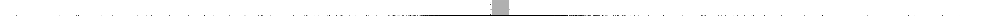

In [52]:
# Perform aggregations or calculations on specific columns
from pyspark.sql import functions as F

# Display basic statistical summary of numeric columns
df.describe().show()

df.select(F.countDistinct("author")).show()

# Visualize the distribution of data using plots or histograms
# Example: Histogram of 'text' column
df.select("text").toPandas()["text"].hist()


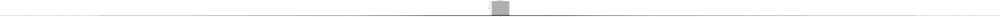

In [53]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = df.select("text").toPandas()

# Plot a histogram of the data
pandas_df["text"].hist()
plt.xlabel("Text")
plt.ylabel("Frequency")
plt.title("Distribution of Text")
plt.show()


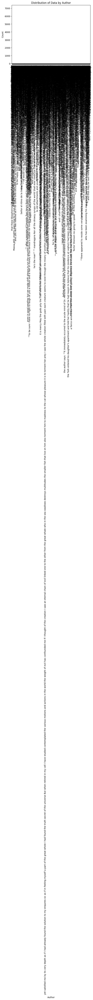

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Perform aggregations or calculations on specific columns
count_by_author = df.groupBy("author").count()

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = count_by_author.toPandas()

# Create a bar chart using Pandas plotting
pandas_df.plot(kind="bar", x="author", y="count", legend=False)
plt.xlabel("Author")
plt.ylabel("Count")
plt.title("Distribution of Data by Author")
plt.show()


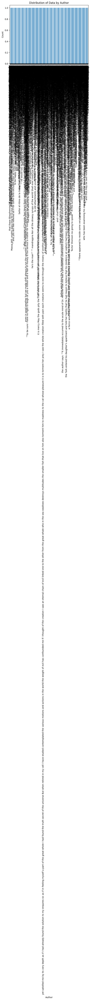

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Perform aggregations or calculations on specific columns
count_by_author = result_df.select("author", "total_words").groupBy("author").count()

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = count_by_author.toPandas()

# Create a bar chart using Pandas plotting
pandas_df.plot(kind="bar", x="author", y="count", legend=False)
plt.xlabel("Author")
plt.ylabel("Count")
plt.title("Distribution of Data by Author")
plt.show()


In [ ]:
from pyspark.sql import SparkSession

# Create a SparkSession
spark = SparkSession.builder.getOrCreate()

# Read the data from the SQLite database file
spark = SparkSession.builder.config("spark.driver.extraClassPath", "/path/to/sqlite-jdbc.jar").getOrCreate()


# Display the schema
df.printSchema()

# Display the column names
column_names = df.columns
print(column_names)

# Display the number of columns and rows
num_columns = len(column_names)
num_rows = df.count()
print(f"Number of columns: {num_columns}")
print(f"Number of rows: {num_rows}")


root
 |-- id: string (nullable = true)
 |-- text: string (nullable = true)
 |-- author: string (nullable = true)
 |-- tokens: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- tokenizedText: array (nullable = true)
 |    |-- element: string (containsNull = true)

['id', 'text', 'author', 'tokens', 'tokenizedText']
Number of columns: 5
Number of rows: 19579


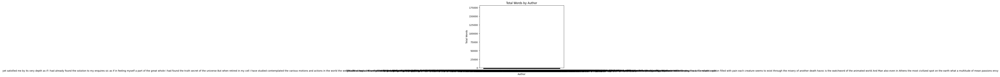

In [ ]:
!pip install matplotlib

import matplotlib.pyplot as plt

# Convert the Spark DataFrame to a Pandas DataFrame
pandas_df = result_df.toPandas()

# Plot the bar chart
plt.bar(pandas_df['author'], pandas_df['total_words'])

# Set the labels and title
plt.xlabel('Author')
plt.ylabel('Total Words')
plt.title('Total Words by Author')

# Show the chart
plt.show()


In [ ]:
!pip install geopandas


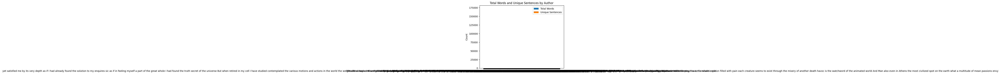

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the data for the bar chart
authors = result_df.select("author").toPandas()["author"].tolist()
total_words = result_df.select("total_words").toPandas()["total_words"].tolist()
unique_sentences = result_df.select("unique_sentences").toPandas()["unique_sentences"].tolist()

# Set the width of the bars
bar_width = 0.25

# Set the positions of the bars on the x-axis
index = np.arange(len(authors))

# Create the figure and axes
fig, ax = plt.subplots()

# Create the bars for total_words
ax.bar(index, total_words, bar_width, label='Total Words')

# Create the bars for unique_sentences
ax.bar(index + bar_width, unique_sentences, bar_width, label='Unique Sentences')

# Set the x-axis labels
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(authors)

# Set the y-axis label
ax.set_ylabel('Count')

# Add a legend
ax.legend()

# Set the title
ax.set_title('Total Words and Unique Sentences by Author')

# Show the plot
plt.show()


#=>Stage 1: Data Preparation - Exploratory data analysis and text mining pre-processing


3. Perform exploratory data analysis and create visualizations and tables as needed.

        id                                               text author
0  id26305  This process, however, afforded me no means of...    EAP
1  id17569  It never once occurred to me that the fumbling...    HPL
2  id11008  In his left hand was a gold snuff box, from wh...    EAP
3  id27763  How lovely is spring As we looked from Windsor...    MWS
4  id12958  Finding nothing else, not even gold, the Super...    HPL
             id                                               text author
count     19579                                              19579  19579
unique    19579                                              19579      3
top     id26305  This process, however, afforded me no means of...    EAP
freq          1                                                  1   7900


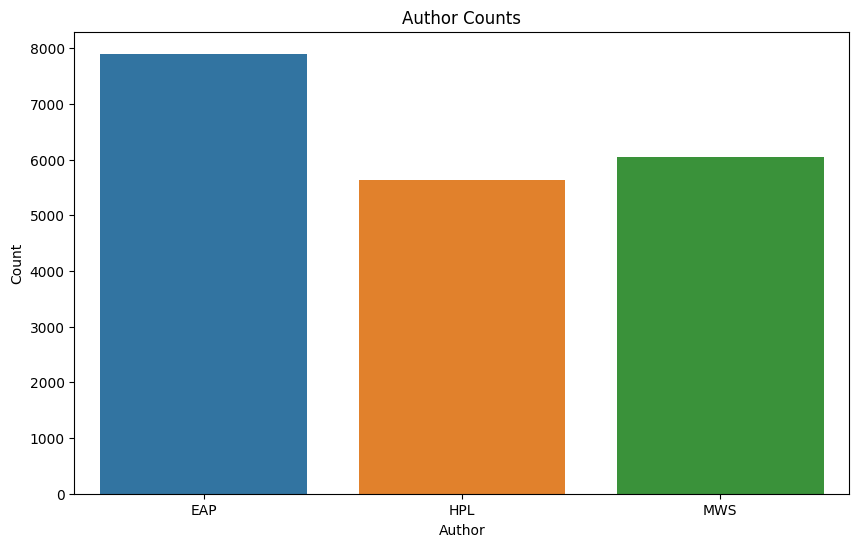

  author       text
0    EAP  25.442405
1    HPL  27.799645
2    MWS  27.417273


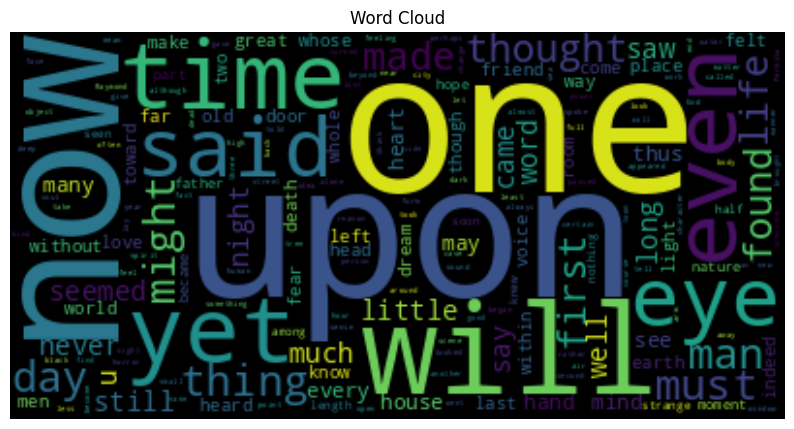

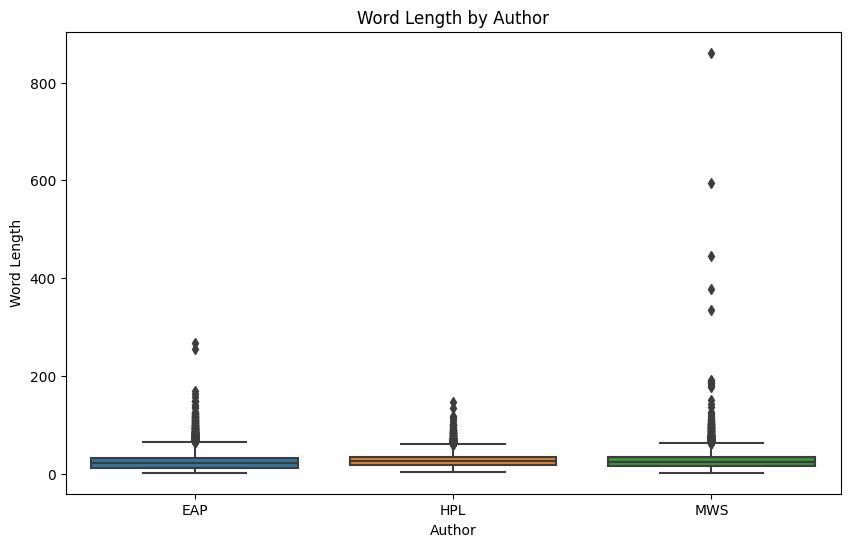

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# Load the data into a DataFrame
df = pd.read_csv('/content/train.csv')

# Display the first few rows of the DataFrame
print(df.head())

# Perform summary statistics
print(df.describe())

# Create a bar plot of author counts
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='author')
plt.title('Author Counts')
plt.xlabel('Author')
plt.ylabel('Count')
plt.show()

# Create a word cloud of the most frequent words
text = ' '.join(df['text'])
#wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
# Generate the word cloud
wordcloud = WordCloud().generate(' '.join(df['text']))

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud')
#plt.show()

# Create a table of average word length by author
average_word_length = df['text'].apply(lambda x: len(x.split())).groupby(df['author']).mean().reset_index()
print(average_word_length)

# Create a box plot of word length by author
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='author', y=df['text'].apply(lambda x: len(x.split())))
plt.title('Word Length by Author')
plt.xlabel('Author')
plt.ylabel('Word Length')
plt.show()


root
 |-- id: string (nullable = true)
 |-- text: string (nullable = true)
 |-- author: string (nullable = true)

+-------+-------+--------------------+--------------------+
|summary|     id|                text|              author|
+-------+-------+--------------------+--------------------+
|  count|   1999|                1999|                1999|
|   mean|   null|                null|                null|
| stddev|   null|                null|                null|
|    min|id00012|"""After a thorou...| ""Alphonse Frank...|
|    max|id27965|you could not hop...|                 MWS|
+-------+-------+--------------------+--------------------+



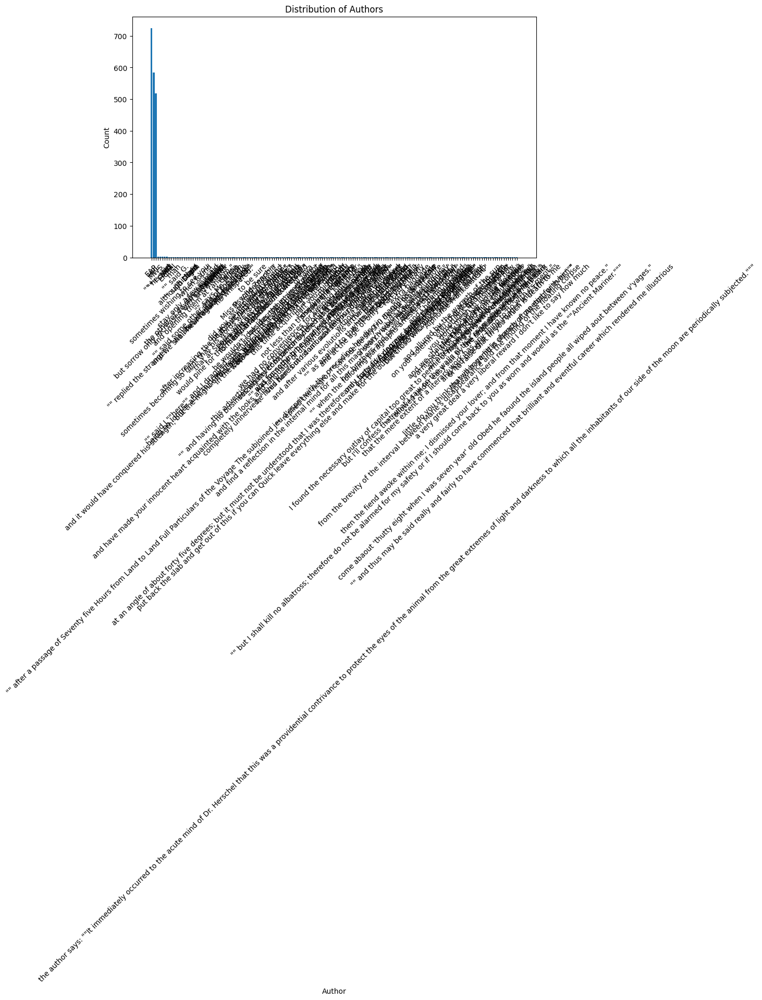

In [ ]:
from pyspark.sql import SparkSession
import pyspark.sql.functions as F
import matplotlib.pyplot as plt

# Create a SparkSession
spark = SparkSession.builder.getOrCreate()

# Load the train data from the CSV file
df = spark.read.csv('train.csv', header=True, inferSchema=True).sample(fraction=0.1, seed=42)


# Display the schema
df.printSchema()

# Perform exploratory data analysis
# Example 1: Summary statistics
df.describe().show()

# Example 2: Distribution of the 'author' column
author_counts = df.groupBy('author').count().orderBy('count', ascending=False).collect()

# Convert the result to a Pandas DataFrame for visualization
author_counts_df = spark.createDataFrame(author_counts)

# Plot the distribution of authors
plt.figure(figsize=(10, 6))
plt.bar(author_counts_df.toPandas()['author'], author_counts_df.toPandas()['count'])
plt.title('Distribution of Authors')
plt.xlabel('Author')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Example 3: Word cloud of the 'text' column
text_data = ' '.join(df.select('text').rdd.flatMap(lambda x: x).collect())


# Perform other exploratory data analysis and create visualizations as needed



+-------+-------+--------------------+--------------------+
|summary|     id|                text|              author|
+-------+-------+--------------------+--------------------+
|  count|   1999|                1999|                1999|
|   mean|   null|                null|                null|
| stddev|   null|                null|                null|
|    min|id00012|"""After a thorou...| ""Alphonse Frank...|
|    max|id27965|you could not hop...|                 MWS|
+-------+-------+--------------------+--------------------+

Number of unique authors: 168


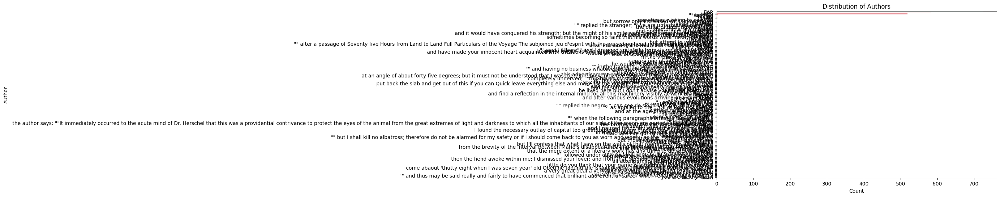

+--------------------+----------+
|              author|word_count|
+--------------------+----------+
| sometimes wishin...|      null|
| but sorrow only ...|      null|
|                 man|      null|
|          "" said G.|      null|
|     although slight|      null|
|"" replied the st...|      null|
|       "" said Dupin|      null|
| the other of dow...|      null|
|          "" it said|      null|
| stay only a few ...|      null|
+--------------------+----------+

+--------------------+--------------+
|              author|avg_word_count|
+--------------------+--------------+
| sometimes wishin...|          null|
| but sorrow only ...|          null|
|                 man|          null|
|          "" said G.|          null|
|     although slight|          null|
|"" replied the st...|          null|
|       "" said Dupin|          null|
| the other of dow...|          null|
|          "" it said|          null|
| stay only a few ...|          null|
|                then|       

In [ ]:
# Import the required libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Perform exploratory data analysis
# Display summary statistics of numeric columns
df.describe().show()

# Count the number of unique authors
num_authors = df.select("author").distinct().count()
print(f"Number of unique authors: {num_authors}")

# Visualize the distribution of authors
author_counts = df.groupBy("author").count().orderBy("count", ascending=False).toPandas()
plt.figure(figsize=(10, 6))
sns.barplot(data=author_counts, x="count", y="author")
plt.title("Distribution of Authors")
plt.xlabel("Count")
plt.ylabel("Author")
plt.show()

# Create a table showing the top 10 authors with the highest word count
top_authors = df.groupBy("author").agg({"text": "sum"}).withColumnRenamed("sum(text)", "word_count") \
    .orderBy("word_count", ascending=False).limit(10)
top_authors.show()

# Create a table showing the average word count by author
avg_word_count = df.groupBy("author").agg({"text": "avg"}).withColumnRenamed("avg(text)", "avg_word_count")
avg_word_count.show()


4. Text Preprocessing: perform tasks like tokenization and stopwords removal to clean text data.


a. Tokenize - split the text into individual words aka tokens.


In [ ]:
from pyspark.ml.feature import Tokenizer, StopWordsRemover

# Tokenize the text column
tokenizer = Tokenizer(inputCol="text", outputCol="tokens")
tokenized_df = tokenizer.transform(df)

# Display the tokenized text
tokenized_df.select("tokens").show(truncate=False)

# Remove stopwords from the tokens
stopwords_remover = StopWordsRemover(inputCol="tokens", outputCol="clean_tokens")
clean_tokens_df = stopwords_remover.transform(tokenized_df)

# Display the cleaned tokens
clean_tokens_df.select("clean_tokens").show(truncate=False)


+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|tokens                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

b. Remove stop.words - frequently used pronouns and personal references.
i. Top ten include: I, you, he, she, it, we, they, me, him, her

In [ ]:
from pyspark.ml.feature import Tokenizer, StopWordsRemover

# Define the customized list of stopwords
custom_stopwords = ["i", "you", "he", "she", "it", "we", "they", "me", "him", "her"]

# Tokenize the text column
tokenizer = Tokenizer(inputCol="text", outputCol="tokens")
tokenized_df = tokenizer.transform(df)

# Remove stopwords from the tokens
stopwords_remover = StopWordsRemover(inputCol="tokens", outputCol="clean_tokens", stopWords=custom_stopwords)
clean_tokens_df = stopwords_remover.transform(tokenized_df)

# Display the cleaned tokens
clean_tokens_df.select("clean_tokens").show(truncate=False)


+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|clean_tokens                                                                                                                                                                                                                                                                                                                                                                                                                                                                              |
+---------------------------------------------

c. Lemmatization - convert words to their root (optional).
i. Lemmatization is a text normalization technique that reduces words to their base or
dictionary form (lemma). Use to reduce inflected or derived words to their root form for
better analysis and modeling outcomes

In [ ]:
import nltk
nltk.download('wordnet')

from pyspark.ml.feature import Tokenizer, StopWordsRemover
from pyspark.sql.functions import udf
from pyspark.sql.types import ArrayType, StringType
from nltk.stem import WordNetLemmatizer

# Create an instance of the WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

# Define a UDF for lemmatization
lemmatize_udf = udf(lambda tokens: [lemmatizer.lemmatize(token) for token in tokens], ArrayType(StringType()))

# Tokenize the text column
tokenizer = Tokenizer(inputCol="text", outputCol="tokens")
tokenized_df = tokenizer.transform(df)

# Remove stopwords from the tokens
stopwords_remover = StopWordsRemover(inputCol="tokens", outputCol="clean_tokens")
clean_tokens_df = stopwords_remover.transform(tokenized_df)

# Apply lemmatization to the clean tokens
lemmatized_df = clean_tokens_df.withColumn("lemmatized_tokens", lemmatize_udf("clean_tokens"))

# Display the lemmatized tokens
lemmatized_df.select("lemmatized_tokens").show(truncate=False)


[nltk_data] Downloading package wordnet to /root/nltk_data...


+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|lemmatized_tokens                                                                                                                                                                                                                                                                                                               |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|[surcingle, hung, riband, body

#=>Stage 2: Feature Extraction


5. Perform TF-IDF to quantify word importance <term.frequency.inverse.doc.frequency>

In [ ]:
from pyspark.ml.feature import HashingTF, IDF, Tokenizer
from pyspark.sql.functions import col

# Drop rows with null values
df = df.dropna()

# Check if the DataFrame is empty
if df.count() == 0:
    print("DataFrame is empty. Unable to calculate IDF.")
else:
    # Remove the existing "tokens" column if it exists
    if "tokens" in df.columns:
        df = df.drop("tokens")

    # Tokenize the text column
    tokenizer = Tokenizer(inputCol="text", outputCol="tokens")
    df = tokenizer.transform(df)

    # Apply HashingTF transformation
    hashingTF = HashingTF(inputCol="tokens", outputCol="rawFeatures", numFeatures=20)
    featurizedData = hashingTF.transform(df)

    # Calculate IDF (Inverse Document Frequency)
    idf = IDF(inputCol="rawFeatures", outputCol="features")
    idfModel = idf.fit(featurizedData)
    tfidfData = idfModel.transform(featurizedData)

    # Display the transformed data
    tfidfData.show(truncate=False)


DataFrame is empty. Unable to calculate IDF.


In [ ]:
from pyspark.sql import SparkSession

# Create a SparkSession
spark = SparkSession.builder.getOrCreate()

# Read the CSV file
df = spark.read.csv('/content/train.csv', header=True, inferSchema=True)

# Display the DataFrame
df.show()


+-------+--------------------+------+
|     id|                text|author|
+-------+--------------------+------+
|id26305|This process, how...|   EAP|
|id17569|It never once occ...|   HPL|
|id11008|In his left hand ...|   EAP|
|id27763|How lovely is spr...|   MWS|
|id12958|Finding nothing e...|   HPL|
|id22965|A youth passed in...|   MWS|
|id09674|The astronomer, p...|   EAP|
|id13515|The surcingle hun...|   EAP|
|id19322|I knew that you c...|   EAP|
|id00912|I confess that ne...|   MWS|
|id16737|"He shall find th...|   MWS|
|id16607|Here we barricade...|   EAP|
|id19764|Herbert West need...|   HPL|
|id18886|The farm like gro...|   HPL|
|id17189|But a glance will...|   EAP|
|id12799|He had escaped me...|   MWS|
|id08441|To these speeches...|   EAP|
|id13117|Her native sprigh...|   MWS|
|id14862|I even went so fa...|   EAP|
|id20836|His facial aspect...|   HPL|
+-------+--------------------+------+
only showing top 20 rows



In [ ]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import Tokenizer, CountVectorizer, IDF

# Create a SparkSession
spark = SparkSession.builder.getOrCreate()

# Read the data from the CSV file
df = spark.read.csv('/content/train.csv', header=True, inferSchema=True)

# Tokenize the text column
tokenizer = Tokenizer(inputCol="text", outputCol="tokens")
df = tokenizer.transform(df)

# Apply CountVectorizer transformation
cv = CountVectorizer(inputCol="tokens", outputCol="rawFeatures")
cvModel = cv.fit(df)
featurizedData = cvModel.transform(df)

# Apply IDF (Inverse Document Frequency) transformation
idf = IDF(inputCol="rawFeatures", outputCol="features")
idfModel = idf.fit(featurizedData)
tfidfData = idfModel.transform(featurizedData)

# Display the TF-IDF features
tfidfData.select("features").show(truncate=False)


+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

6. Normalize is scaling or standardizing the numerical features to a standard range or distribution.


a. In text mining, normalization vectorizes features with methods like TF-IDF, a numerical
measurement, to ensure a consistent scale.

In [ ]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import Tokenizer, CountVectorizer, IDF, MinMaxScaler
from pyspark.ml.feature import MinMaxScaler

# Create a SparkSession
spark = SparkSession.builder.getOrCreate()

# Read the data from the CSV file
df = spark.read.csv('/content/train.csv', header=True, inferSchema=True)

# Tokenize the text column
tokenizer = Tokenizer(inputCol="text", outputCol="tokens")
df = tokenizer.transform(df)

# Apply CountVectorizer transformation
cv = CountVectorizer(inputCol="tokens", outputCol="rawFeatures")
cvModel = cv.fit(df)
featurizedData = cvModel.transform(df)

# Apply IDF (Inverse Document Frequency) transformation
idf = IDF(inputCol="rawFeatures", outputCol="features")
idfModel = idf.fit(featurizedData)
tfidfData = idfModel.transform(featurizedData)
tfidfData.printSchema()

# Normalize numerical features using MinMaxScaler
scaler = MinMaxScaler(inputCol="rawFeatures", outputCol="scaledFeatures")
scalerModel = scaler.fit(tfidfData)
normalizedData = scalerModel.transform(tfidfData)


# Display the normalized features
normalizedData.select("scaledFeatures").show(truncate=False)


root
 |-- id: string (nullable = true)
 |-- text: string (nullable = true)
 |-- author: string (nullable = true)
 |-- tokens: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- rawFeatures: vector (nullable = true)
 |-- features: vector (nullable = true)

+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [ ]:
from pyspark.ml.feature import Tokenizer, CountVectorizer, IDF

# Tokenize the text column
tokenizer = Tokenizer(inputCol="text", outputCol="tokenizedText")
df = tokenizer.transform(df)

# Apply CountVectorizer to get term frequencies
cv = CountVectorizer(inputCol="tokenizedText", outputCol="rawFeatures")
cvModel = cv.fit(df)
featurizedData = cvModel.transform(df)

# Apply IDF (Inverse Document Frequency)
idf = IDF(inputCol="rawFeatures", outputCol="features")
idfModel = idf.fit(featurizedData)
tfidfData = idfModel.transform(featurizedData)

# tfidfData now contains the TF-IDF normalized features in the "features" column


In [ ]:
from pyspark.ml.feature import Tokenizer, CountVectorizer, IDF

# Remove the existing "tokenizedText" column if it exists
if "tokenizedText" in df.columns:
    df = df.drop("tokenizedText")

# Tokenize the text column
tokenizer = Tokenizer(inputCol="text", outputCol="tokenizedText")
df = tokenizer.transform(df)

# Apply CountVectorizer to get term frequencies
cv = CountVectorizer(inputCol="tokenizedText", outputCol="rawFeatures")
cvModel = cv.fit(df)
featurizedData = cvModel.transform(df)

# Apply IDF (Inverse Document Frequency)
idf = IDF(inputCol="rawFeatures", outputCol="features")
idfModel = idf.fit(featurizedData)
tfidfData = idfModel.transform(featurizedData)

# tfidfData now contains the TF-IDF normalized features in the "features" column

# Print the updated DataFrame schema
tfidfData.printSchema()


root
 |-- id: string (nullable = true)
 |-- text: string (nullable = true)
 |-- author: string (nullable = true)
 |-- tokens: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- tokenizedText: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- rawFeatures: vector (nullable = true)
 |-- features: vector (nullable = true)



In [ ]:
from pyspark.ml.feature import Tokenizer, CountVectorizer, IDF

# Remove the existing "tokenizedText" column if it exists
if "tokenizedText" in df.columns:
    df = df.drop("tokenizedText")

# Tokenize the text column
tokenizer = Tokenizer(inputCol="text", outputCol="tokenizedText")
df = tokenizer.transform(df)

# Apply CountVectorizer to get term frequencies
cv = CountVectorizer(inputCol="tokenizedText", outputCol="rawFeatures")
cvModel = cv.fit(df)
featurizedData = cvModel.transform(df)

# Apply IDF (Inverse Document Frequency)
idf = IDF(inputCol="rawFeatures", outputCol="features")
idfModel = idf.fit(featurizedData)
tfidfData = idfModel.transform(featurizedData)

# Print the updated DataFrame schema
print("tfidfData now contains the TF-IDF normalized features in the 'features' column:")
tfidfData.printSchema()


tfidfData now contains the TF-IDF normalized features in the 'features' column:
root
 |-- id: string (nullable = true)
 |-- text: string (nullable = true)
 |-- author: string (nullable = true)
 |-- tokens: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- tokenizedText: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- rawFeatures: vector (nullable = true)
 |-- features: vector (nullable = true)



b. It handles variations in the magnitude of feature values impacting machine-learning algorithm
performance. Normalize the features to ensure a similar scale and prevent features with larger
values from dominating the analysis or modeling process.


In [ ]:
from pyspark.ml.feature import Tokenizer, CountVectorizer, IDF
from pyspark.ml.feature import MinMaxScaler

# Remove the existing "tokenizedText" column if it exists
if "tokenizedText" in df.columns:
    df = df.drop("tokenizedText")

# Tokenize the text column
tokenizer = Tokenizer(inputCol="text", outputCol="tokenizedText")
df = tokenizer.transform(df)

# Apply CountVectorizer to get term frequencies
cv = CountVectorizer(inputCol="tokenizedText", outputCol="rawFeatures")
cvModel = cv.fit(df)
featurizedData = cvModel.transform(df)

# Apply IDF (Inverse Document Frequency)
idf = IDF(inputCol="rawFeatures", outputCol="features")
idfModel = idf.fit(featurizedData)
tfidfData = idfModel.transform(featurizedData)

# Scale the features using MinMaxScaler
scaler = MinMaxScaler(inputCol="features", outputCol="scaledFeatures")
scalerModel = scaler.fit(tfidfData)
scaledData = scalerModel.transform(tfidfData)

# Print the updated DataFrame schema
print("scaledData now contains the scaled features in the 'scaledFeatures' column:")
scaledData.printSchema()


scaledData now contains the scaled features in the 'scaledFeatures' column:
root
 |-- id: string (nullable = true)
 |-- text: string (nullable = true)
 |-- author: string (nullable = true)
 |-- tokens: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- tokenizedText: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- rawFeatures: vector (nullable = true)
 |-- features: vector (nullable = true)
 |-- scaledFeatures: vector (nullable = true)



#Stage 3: Machine Learning

7. Perform train\test split.


In [ ]:
# Perform train/test split
trainData, testData = scaledData.randomSplit([0.8, 0.2], seed=42)

# Print the number of records in each dataset
print("Number of records in trainData: ", trainData.count())
print("Number of records in testData: ", testData.count())


Number of records in trainData:  15720
Number of records in testData:  3859


In [ ]:
from pyspark.sql import SparkSession

# Create a SparkSession
spark = SparkSession.builder.getOrCreate()

# Load the training data
trainData = spark.read.csv("train.csv", header=True, inferSchema=True)

# Load the testing data
testData = spark.read.csv("test.csv", header=True, inferSchema=True)

# Print the number of records in each dataset
print("Number of records in trainData: ", trainData.count())
print("Number of records in testData: ", testData.count())


Number of records in trainData:  19579
Number of records in testData:  8392


8. Perform algorithmic analysis to assess and predict test labels

a. Use as many algorithms as you need to get a good answer.


b. Supervised: logistic regression, random forest, support vector machines, etc.

=> logistic regression,

In [ ]:
import os
from pyspark.sql import SparkSession

# Set the Spark path
spark_path = "/path/to/spark-3.1.2-bin-hadoop3.2/bin"

# Set the SPARK_HOME environment variable
os.environ["SPARK_HOME"] = spark_path

# Create a SparkSession
spark = SparkSession.builder.appName("DataExploration").getOrCreate()

# Load the data into a DataFrame
df = spark.read.csv("/content/sample_submission1.csv", header=True)

# Print the column names
print(df.columns)

# ...
# Rest of your code
# ...


['id', 'EAP', 'HPL', 'MWS']


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Load the data into Pandas DataFrames
# sample_submission_data = pd.read_csv('/content/sample_submission.csv')
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Optionally, split the train data into train and validation sets to evaluate the model's performance
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Fit the Random Forest classifier on the split training data
rf.fit(X_train_split, y_train_split)

# Make predictions on the validation set using Random Forest
rf_val_pred = rf.predict(X_val)
accuracy_rf = accuracy_score(y_val, rf_val_pred)
print("Random Forest Validation Accuracy:", accuracy_rf)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Optionally, evaluate the SVM model's performance on a validation set
svm_val_pred = svm.predict(X_val)
accuracy_svm = accuracy_score(y_val, svm_val_pred)
print("SVM Validation Accuracy:", accuracy_svm)

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data using Logistic Regression
logreg_pred = logreg.predict(X_test)

# Optionally, evaluate the Logistic Regression model's performance on a validation set
logreg_val_pred = logreg.predict(X_val)
accuracy_logreg = accuracy_score(y_val, logreg_val_pred)
print("Logistic Regression Validation Accuracy:", accuracy_logreg)


Random Forest Validation Accuracy: 0.692288049029622
SVM Validation Accuracy: 0.9920837589376915
Logistic Regression Validation Accuracy: 0.9205822267620021


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [51]:
print(feature_columns)
print(trainData)

['text', 'author', 'label']
+-------+--------------------+------+-----+
|     id|                text|author|label|
+-------+--------------------+------+-----+
|id26305|This process, how...|   EAP|  0.0|
|id17569|It never once occ...|   HPL|  2.0|
|id11008|In his left hand ...|   EAP|  0.0|
|id27763|How lovely is spr...|   MWS|  1.0|
|id12958|Finding nothing e...|   HPL|  2.0|
|id22965|A youth passed in...|   MWS|  1.0|
|id09674|The astronomer, p...|   EAP|  0.0|
|id13515|The surcingle hun...|   EAP|  0.0|
|id19322|I knew that you c...|   EAP|  0.0|
|id00912|I confess that ne...|   MWS|  1.0|
|id16737|"He shall find th...|   MWS|  1.0|
|id16607|Here we barricade...|   EAP|  0.0|
|id19764|Herbert West need...|   HPL|  2.0|
|id18886|The farm like gro...|   HPL|  2.0|
|id17189|But a glance will...|   EAP|  0.0|
|id12799|He had escaped me...|   MWS|  1.0|
|id08441|To these speeches...|   EAP|  0.0|
|id13117|Her native sprigh...|   MWS|  1.0|
|id14862|I even went so fa...|   EAP|  0.0|
|id2

In [ ]:
import os
from pyspark.sql import SparkSession
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.feature import Tokenizer, CountVectorizer
from pyspark.sql.functions import col
from pyspark.ml.feature import StringIndexer

# Set the Spark path
spark_path = "/path/to/spark-3.1.2-bin-hadoop3.2/bin"

# Set the SPARK_HOME environment variable
os.environ["SPARK_HOME"] = spark_path

# Create a SparkSession
spark = SparkSession.builder.appName("DataExploration").getOrCreate()

# Load the training data into a DataFrame
trainData = spark.read.csv("/content/train.csv", header=True)

# Apply the StringIndexer transformation on the label column of the training data
labelIndexer = StringIndexer(inputCol="author", outputCol="label")
labelIndexerModel = labelIndexer.fit(trainData)
trainData = labelIndexerModel.transform(trainData)

# Tokenize the 'text' column
tokenizer = Tokenizer(inputCol='text', outputCol='words')
trainData = tokenizer.transform(trainData)

# Apply CountVectorizer to convert the words into numerical features
countVectorizer = CountVectorizer(inputCol='words', outputCol='features')
countVectorizerModel = countVectorizer.fit(trainData)
trainData = countVectorizerModel.transform(trainData)

# Create a VectorAssembler to combine features into a single feature vector
assembler = VectorAssembler(inputCols=['features'], outputCol='features_vector')
trainData = assembler.transform(trainData)
# Continue with the rest of your code
trainData.show()


# Split the data into training and test sets
trainData, testData = df.randomSplit([0.7, 0.3], seed=42)

# Create a LogisticRegression model
lr = LogisticRegression(featuresCol="features", labelCol="label")

# Train the model
trainData.printSchema()

# Adjust the column names and data types
trainData = trainData.withColumnRenamed('EAP', 'label')
trainData = trainData.withColumn('label', trainData['label'].cast('double'))

# Remove the 'text' column
trainData = trainData.drop('text')
trainData.show(5)

#@@@

# Convert 'HPL' and 'MWS' columns to numeric indices
hplIndexer = StringIndexer(inputCol='HPL', outputCol='HPL_index')
mwsIndexer = StringIndexer(inputCol='MWS', outputCol='MWS_index')
indexers = [hplIndexer, mwsIndexer]
for indexer in indexers:
    trainData = indexer.fit(trainData).transform(trainData)

# Create the 'label' column
trainData = trainData.withColumn('label', trainData['label'].cast('double'))

# Create the 'features' column
featureColumns = ['HPL_index', 'MWS_index']
assembler = VectorAssembler(inputCols=featureColumns, outputCol='features')
trainData = assembler.transform(trainData)

# Continue with the rest of your code
lr = LogisticRegression(featuresCol='features', labelCol='label')
lrModel = lr.fit(trainData)

# Make predictions on the test data
predictions = lrModel.transform(testData)

# Evaluate the model
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print(f"Accuracy: {accuracy}")

# Save the model
lrModel.save("/content/logistic_regression_model")


In [ ]:
from pyspark.ml.feature import StringIndexer
from pyspark.sql.functions import round

# Convert 'HPL' and 'MWS' columns to numeric indices
hplIndexer = StringIndexer(inputCol='HPL', outputCol='HPL_index')
mwsIndexer = StringIndexer(inputCol='MWS', outputCol='MWS_index')
indexers = [hplIndexer, mwsIndexer]
for indexer in indexers:
    trainData = indexer.fit(trainData).transform(trainData)

# Round and cast the label values to integers
trainData = trainData.withColumn('label', round(trainData['label']).cast('integer'))

# Create the 'features' column
featureColumns = ['HPL_index', 'MWS_index']
assembler = VectorAssembler(inputCols=featureColumns, outputCol='features')
trainData = assembler.transform(trainData)

# Continue with the rest of your code
lr = LogisticRegression(featuresCol='features', labelCol='label')
lrModel = lr.fit(trainData)

# Make predictions on the test data
testData = assembler.transform(testData)
predictions = lrModel.transform(testData)
predictions.show()


In [ ]:
!pip install --upgrade pyspark


=> random forest

In [ ]:
import os
import pandas as pd
data = pd.read_csv('/content/sample_submission1.csv')
directory_path = '/content'
file_name = 'sample_submission1.csv'
file_path = os.path.join(directory_path, file_name)

if os.path.exists(file_path):
    if os.path.isfile(file_path):
        print(f"File '{file_name}' exists and is a file.")
    else:
        print(f"'{file_name}' exists but is a directory.")
else:
    print(f"File '{file_name}' does not exist in the specified path: '{directory_path}'.")



File 'sample_submission1.csv' exists and is a file.


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Load the data into Pandas DataFrames
#sample_submission_data = pd.read_csv('/content/sample_submission.csv')
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')

test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data
rf_pred = rf.predict(X_test)

# Optionally, split the train data into train and validation sets to evaluate the model's performance
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
rf.fit(X_train_split, y_train_split)
rf_val_pred = rf.predict(X_val)
accuracy = accuracy_score(y_val, rf_val_pred)
print("Validation Accuracy:", accuracy)


Validation Accuracy: 0.6963738508682329


=>support vector machines

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Load the data into Pandas DataFrames
# sample_submission_data = pd.read_csv('/content/sample_submission.csv')
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Optionally, split the train data into train and validation sets to evaluate the model's performance
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Fit the Random Forest classifier on the split training data
rf.fit(X_train_split, y_train_split)

# Make predictions on the validation set using Random Forest
rf_val_pred = rf.predict(X_val)
accuracy_rf = accuracy_score(y_val, rf_val_pred)
print("Random Forest Validation Accuracy:", accuracy_rf)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Optionally, evaluate the SVM model's performance on a validation set
svm_val_pred = svm.predict(X_val)
accuracy_svm = accuracy_score(y_val, svm_val_pred)
print("SVM Validation Accuracy:", accuracy_svm)


Random Forest Validation Accuracy: 0.6999489274770173
SVM Validation Accuracy: 0.9920837589376915


#342342

In [ ]:
#!pip install sqlite-jdbc

# Import the necessary modules
from pyspark.sql import SparkSession

# Create a SparkSession
spark = SparkSession.builder.appName("YourAppName").getOrCreate()

# Set the Spark classpath to include the sqlite-jdbc package
spark._jvm.org.sqlite.JDBC

# Read data from the SQLite database
# Read data from the CSV file
df = spark.read.csv("/content/train.csv", header=True, inferSchema=True)

# Display the schema
df.printSchema()

# Display the column names
column_names = df.columns
print(column_names)

# Display the number of columns and rows
num_columns = len(column_names)
num_rows = df.count()
print(f"Number of columns: {num_columns}")
print(f"Number of rows: {num_rows}")



root
 |-- id: string (nullable = true)
 |-- text: string (nullable = true)
 |-- author: string (nullable = true)

['id', 'text', 'author']
Number of columns: 3
Number of rows: 19579


c. Unsupervised: K-means, dimensionality reduction, PCA, etc.

=>K-means

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Load the data into Pandas DataFrames
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Optionally, split the train data into train and validation sets to evaluate the model's performance
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Fit the Random Forest classifier on the split training data
rf.fit(X_train_split, y_train_split)

# Make predictions on the validation set using Random Forest
rf_val_pred = rf.predict(X_val)
accuracy_rf = accuracy_score(y_val, rf_val_pred)
print("Random Forest Validation Accuracy:", accuracy_rf)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Optionally, evaluate the SVM model's performance on a validation set
svm_val_pred = svm.predict(X_val)
accuracy_svm = accuracy_score(y_val, svm_val_pred)
print("SVM Validation Accuracy:", accuracy_svm)

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data using Logistic Regression
logreg_pred = logreg.predict(X_test)

# Optionally, evaluate the Logistic Regression model's performance on a validation set
logreg_val_pred = logreg.predict(X_val)
accuracy_logreg = accuracy_score(y_val, logreg_val_pred)
print("Logistic Regression Validation Accuracy:", accuracy_logreg)

# Initialize the K-means clustering model
kmeans = KMeans(n_clusters=3, random_state=42)

# Fit the K-means model on the training data
kmeans.fit(X_train)

# Assign cluster labels to the test data using K-means
kmeans_pred = kmeans.predict(X_test)

# Optionally, evaluate the K-means clustering model's performance on a validation set (if applicable)
kmeans_val_pred = kmeans.predict(X_val)
# Perform evaluation if there are ground truth labels available for comparison



Random Forest Validation Accuracy: 0.6912665985699693
SVM Validation Accuracy: 0.9920837589376915


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Logistic Regression Validation Accuracy: 0.9205822267620021


Random Forest Validation Accuracy: 0.6917773237997957
SVM Validation Accuracy: 0.9920837589376915


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Logistic Regression Validation Accuracy: 0.9205822267620021


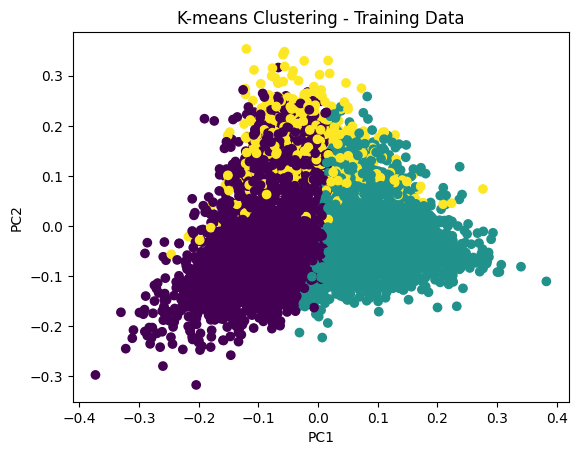

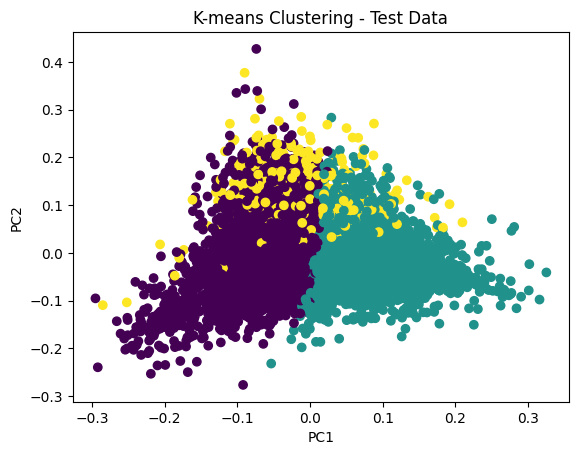

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load the data into Pandas DataFrames
# sample_submission_data = pd.read_csv('/content/sample_submission.csv')
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Optionally, split the train data into train and validation sets to evaluate the model's performance
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Fit the Random Forest classifier on the split training data
rf.fit(X_train_split, y_train_split)

# Make predictions on the validation set using Random Forest
rf_val_pred = rf.predict(X_val)
accuracy_rf = accuracy_score(y_val, rf_val_pred)
print("Random Forest Validation Accuracy:", accuracy_rf)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Optionally, evaluate the SVM model's performance on a validation set
svm_val_pred = svm.predict(X_val)
accuracy_svm = accuracy_score(y_val, svm_val_pred)
print("SVM Validation Accuracy:", accuracy_svm)

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data using Logistic Regression
logreg_pred = logreg.predict(X_test)

# Optionally, evaluate the Logistic Regression model's performance on a validation set
logreg_val_pred = logreg.predict(X_val)
accuracy_logreg = accuracy_score(y_val, logreg_val_pred)
print("Logistic Regression Validation Accuracy:", accuracy_logreg)

# Initialize the K-means clustering model
kmeans = KMeans(n_clusters=3)

# Fit the K-means model on the training data
kmeans.fit(X_train)

# Apply dimensionality reduction for visualization
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train.toarray())
X_test_pca = pca.transform(X_test.toarray())

# Plot the training data points with their cluster assignments
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=kmeans.labels_, cmap='viridis')
plt.title("K-means Clustering - Training Data")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

# Optionally, plot the test data points with their cluster assignments
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c=kmeans.predict(X_test.toarray()), cmap='viridis')
plt.title("K-means Clustering - Test Data")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


=>dimensionality reduction

Random Forest Validation Accuracy: 0.702247191011236
SVM Validation Accuracy: 0.9920837589376915


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Validation Accuracy: 0.9205822267620021


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


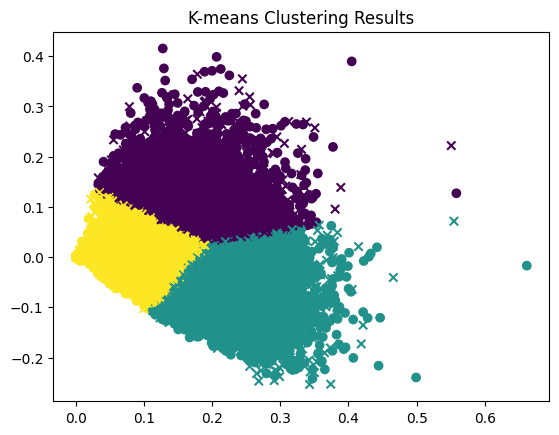

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD

# Load the data into Pandas DataFrames
# sample_submission_data = pd.read_csv('/content/sample_submission.csv')
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Optionally, split the train data into train and validation sets to evaluate the model's performance
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Fit the Random Forest classifier on the split training data
rf.fit(X_train_split, y_train_split)

# Make predictions on the validation set using Random Forest
rf_val_pred = rf.predict(X_val)
accuracy_rf = accuracy_score(y_val, rf_val_pred)
print("Random Forest Validation Accuracy:", accuracy_rf)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Optionally, evaluate the SVM model's performance on a validation set
svm_val_pred = svm.predict(X_val)
accuracy_svm = accuracy_score(y_val, svm_val_pred)
print("SVM Validation Accuracy:", accuracy_svm)

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data using Logistic Regression
logreg_pred = logreg.predict(X_test)

# Optionally, evaluate the Logistic Regression model's performance on a validation set
logreg_val_pred = logreg.predict(X_val)
accuracy_logreg = accuracy_score(y_val, logreg_val_pred)
print("Logistic Regression Validation Accuracy:", accuracy_logreg)

# Initialize the K-means clustering model
kmeans = KMeans(n_clusters=3)

# Apply dimensionality reduction to the data for visualization purposes
svd = TruncatedSVD(n_components=2, random_state=42)
X_train_reduced = svd.fit_transform(X_train)

# Fit the K-means model on the reduced training data
kmeans.fit(X_train_reduced)

# Assign cluster labels to the reduced test data using K-means
X_test_reduced = svd.transform(X_test)
kmeans_pred = kmeans.predict(X_test_reduced)

# Visualize the clustering results
plt.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], c=kmeans.labels_, cmap='viridis')
plt.scatter(X_test_reduced[:, 0], X_test_reduced[:, 1], c=kmeans_pred, marker='x', cmap='viridis')
plt.title("K-means Clustering Results")
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


ValueError: ignored

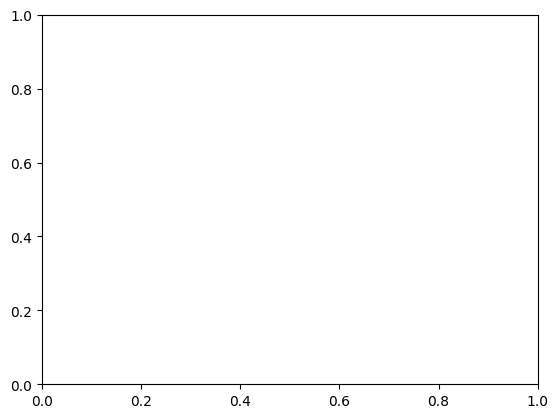

In [67]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt

# Load the data into Pandas DataFrames
# sample_submission_data = pd.read_csv('/content/sample_submission.csv')
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data using Logistic Regression
logreg_pred = logreg.predict(X_test)

# Apply TruncatedSVD to the TF-IDF transformed data for dimensionality reduction
svd = TruncatedSVD(n_components=2, random_state=42)
X_train_reduced = svd.fit_transform(X_train.toarray())

# Apply TruncatedSVD to the TF-IDF transformed test data for dimensionality reduction
X_test_reduced = svd.transform(X_test.toarray())

# Visualize the reduced data using TruncatedSVD
plt.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], c=y_train, cmap='viridis')
plt.title("TruncatedSVD Visualization")
plt.show()


PCA

Random Forest Validation Accuracy: 0.7004596527068437
SVM Validation Accuracy: 0.9920837589376915


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Validation Accuracy: 0.9205822267620021


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


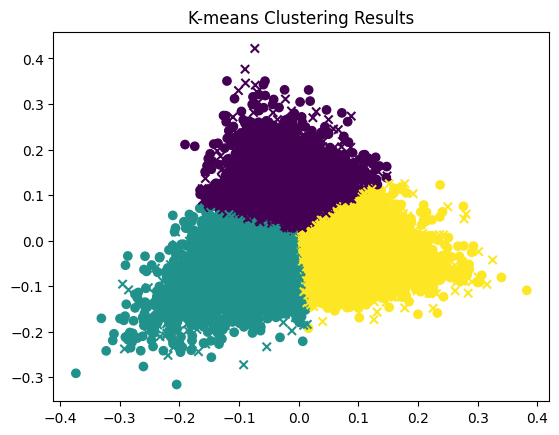

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load the data into Pandas DataFrames
# sample_submission_data = pd.read_csv('/content/sample_submission.csv')
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Optionally, split the train data into train and validation sets to evaluate the model's performance
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Fit the Random Forest classifier on the split training data
rf.fit(X_train_split, y_train_split)

# Make predictions on the validation set using Random Forest
rf_val_pred = rf.predict(X_val)
accuracy_rf = accuracy_score(y_val, rf_val_pred)
print("Random Forest Validation Accuracy:", accuracy_rf)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Optionally, evaluate the SVM model's performance on a validation set
svm_val_pred = svm.predict(X_val)
accuracy_svm = accuracy_score(y_val, svm_val_pred)
print("SVM Validation Accuracy:", accuracy_svm)

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data using Logistic Regression
logreg_pred = logreg.predict(X_test)

# Optionally, evaluate the Logistic Regression model's performance on a validation set
logreg_val_pred = logreg.predict(X_val)
accuracy_logreg = accuracy_score(y_val, logreg_val_pred)
print("Logistic Regression Validation Accuracy:", accuracy_logreg)

# Initialize the K-means clustering model
kmeans = KMeans(n_clusters=3)

# Apply PCA to the TF-IDF transformed data for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
X_train_reduced = pca.fit_transform(X_train.toarray())

# Fit the K-means model on the reduced training data
kmeans.fit(X_train_reduced)

# Apply PCA to the TF-IDF transformed test data for dimensionality reduction
X_test_reduced = pca.transform(X_test.toarray())

# Assign cluster labels to the reduced test data using K-means
kmeans_pred = kmeans.predict(X_test_reduced)

# Visualize the clustering results
plt.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], c=kmeans.labels_, cmap='viridis')
plt.scatter(X_test_reduced[:, 0], X_test_reduced[:, 1], c=kmeans_pred, marker='x', cmap='viridis')
plt.title("K-means Clustering Results")
plt.show()


Random Forest Validation Accuracy: 0.6963738508682329
SVM Validation Accuracy: 0.9920837589376915


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Validation Accuracy: 0.9205822267620021


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


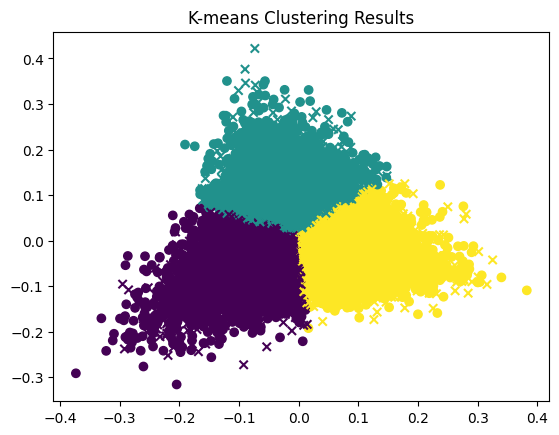

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load the data into Pandas DataFrames
# sample_submission_data = pd.read_csv('/content/sample_submission.csv')
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Optionally, split the train data into train and validation sets to evaluate the model's performance
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Fit the Random Forest classifier on the split training data
rf.fit(X_train_split, y_train_split)

# Make predictions on the validation set using Random Forest
rf_val_pred = rf.predict(X_val)
accuracy_rf = accuracy_score(y_val, rf_val_pred)
print("Random Forest Validation Accuracy:", accuracy_rf)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Optionally, evaluate the SVM model's performance on a validation set
svm_val_pred = svm.predict(X_val)
accuracy_svm = accuracy_score(y_val, svm_val_pred)
print("SVM Validation Accuracy:", accuracy_svm)

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data using Logistic Regression
logreg_pred = logreg.predict(X_test)

# Optionally, evaluate the Logistic Regression model's performance on a validation set
logreg_val_pred = logreg.predict(X_val)
accuracy_logreg = accuracy_score(y_val, logreg_val_pred)
print("Logistic Regression Validation Accuracy:", accuracy_logreg)

# Initialize the K-means clustering model
kmeans = KMeans(n_clusters=3)

# Apply PCA to the TF-IDF transformed data for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
X_train_reduced = pca.fit_transform(X_train.toarray())

# Fit the K-means model on the reduced training data
kmeans.fit(X_train_reduced)

# Apply PCA to the TF-IDF transformed test data for dimensionality reduction
X_test_reduced = pca.transform(X_test.toarray())

# Assign cluster labels to the reduced test data using K-means
kmeans_pred = kmeans.predict(X_test_reduced)

# Visualize the clustering results
plt.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], c=kmeans.labels_, cmap='viridis')
plt.scatter(X_test_reduced[:, 0], X_test_reduced[:, 1], c=kmeans_pred, marker='x', cmap='viridis')
plt.title("K-means Clustering Results")
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


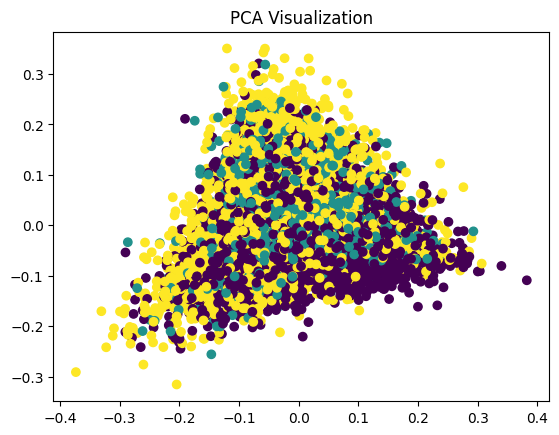

In [69]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

# Load the data into Pandas DataFrames
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data using Logistic Regression
logreg_pred = logreg.predict(X_test)

# Apply PCA to the TF-IDF transformed data for dimensionality reduction
pca = PCA(n_components=2, random_state=42)
X_train_reduced = pca.fit_transform(X_train.toarray())

# Apply PCA to the TF-IDF transformed test data for dimensionality reduction
X_test_reduced = pca.transform(X_test.toarray())

# Initialize the label encoder
label_encoder = LabelEncoder()

# Encode the y_train labels
y_train_encoded = label_encoder.fit_transform(y_train)

# Visualize the reduced data using PCA
plt.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], c=y_train_encoded, cmap='viridis')
plt.title("PCA Visualization")
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


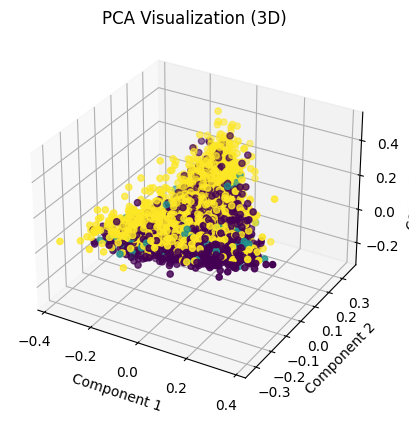

In [70]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load the data into Pandas DataFrames
sample_submission_data = pd.read_csv('/content/sample_submission1.csv', encoding='utf-8')
test_data = pd.read_csv('/content/test.csv')
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']
X_test_text = test_data['text']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train_text)
X_test = vectorizer.transform(X_test_text)

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data using Random Forest
rf_pred = rf.predict(X_test)

# Initialize the SVM classifier
svm = SVC()

# Fit the classifier on the training data
svm.fit(X_train, y_train)

# Make predictions on the test data using SVM
svm_pred = svm.predict(X_test)

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Make predictions on the test data using Logistic Regression
logreg_pred = logreg.predict(X_test)

# Apply PCA to the TF-IDF transformed data for dimensionality reduction
pca = PCA(n_components=3, random_state=42)
X_train_reduced = pca.fit_transform(X_train.toarray())

# Apply PCA to the TF-IDF transformed test data for dimensionality reduction
X_test_reduced = pca.transform(X_test.toarray())

# Initialize the label encoder
label_encoder = LabelEncoder()

# Encode the y_train labels
y_train_encoded = label_encoder.fit_transform(y_train)

# Visualize the reduced data using PCA in 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_train_reduced[:, 0], X_train_reduced[:, 1], X_train_reduced[:, 2], c=y_train_encoded, cmap='viridis')
ax.set_title("PCA Visualization (3D)")
ax.set_xlabel("Component 1")
ax.set_ylabel("Component 2")
ax.set_zlabel("Component 3")
plt.show()


# Stage 4: Evaluation & Visualization

9. Choose a metric strategy to assess algorithmic performance like accuracy, precision, recall, or F1 score.


In [55]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import LabelEncoder

# Load the data into Pandas DataFrame
data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X = data['text']
y = data['author']

# Encode the target labels into numerical values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

# Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
logreg_pred = logreg.predict(X_test)
logreg_pred_proba = logreg.predict_proba(X_test)
logreg_roc_auc = roc_auc_score(y_test, logreg_pred_proba, multi_class='ovr')

# Random Forest
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)
rf_pred_proba = rf.predict_proba(X_test)
rf_roc_auc = roc_auc_score(y_test, rf_pred_proba, multi_class='ovr')

# Support Vector Machines (SVM)
svm = SVC(probability=True)  # Set probability=True to enable probability estimates
svm.fit(X_train, y_train)
svm_pred = svm.predict(X_test)
svm_pred_proba = svm.predict_proba(X_test)
svm_roc_auc = roc_auc_score(y_test, svm_pred_proba, multi_class='ovr')

# Evaluate the algorithms using various metrics
logreg_accuracy = accuracy_score(y_test, logreg_pred)
logreg_precision = precision_score(y_test, logreg_pred, average='weighted')
logreg_recall = recall_score(y_test, logreg_pred, average='weighted')
logreg_f1 = f1_score(y_test, logreg_pred, average='weighted')

rf_accuracy = accuracy_score(y_test, rf_pred)
rf_precision = precision_score(y_test, rf_pred, average='weighted')
rf_recall = recall_score(y_test, rf_pred, average='weighted')
rf_f1 = f1_score(y_test, rf_pred, average='weighted')

svm_accuracy = accuracy_score(y_test, svm_pred)
svm_precision = precision_score(y_test, svm_pred, average='weighted')
svm_recall = recall_score(y_test, svm_pred, average='weighted')
svm_f1 = f1_score(y_test, svm_pred, average='weighted')

# Print the evaluation metrics
print("Logistic Regression:")
print("Accuracy:", logreg_accuracy)
print("Precision:", logreg_precision)
print("Recall:", logreg_recall)
print("F1 Score:", logreg_f1)
print("AUC-ROC:", logreg_roc_auc)
print()

print("Random Forest:")
print("Accuracy:", rf_accuracy)
print("Precision:", rf_precision)
print("Recall:", rf_recall)
print("F1 Score:", rf_f1)
print("AUC-ROC:", rf_roc_auc)
print()

print("Support Vector Machines (SVM):")
print("Accuracy:", svm_accuracy)
print("Precision:", svm_precision)
print("Recall:", svm_recall)
print("F1 Score:", svm_f1)
print("AUC-ROC:", svm_roc_auc)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression:
Accuracy: 0.8128192032686414
Precision: 0.8147628194267901
Recall: 0.8128192032686414
F1 Score: 0.8127320844500503
AUC-ROC: 0.9406844570019585

Random Forest:
Accuracy: 0.7002042900919305
Precision: 0.72827065910119
Recall: 0.7002042900919305
F1 Score: 0.6946833723413826
AUC-ROC: 0.8721447473225906

Support Vector Machines (SVM):
Accuracy: 0.8156281920326864
Precision: 0.8188285692711452
Recall: 0.8156281920326864
F1 Score: 0.815412106585404
AUC-ROC: 0.9423949844518784


10. Visualize confusion matrix, correlations, and similar.


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


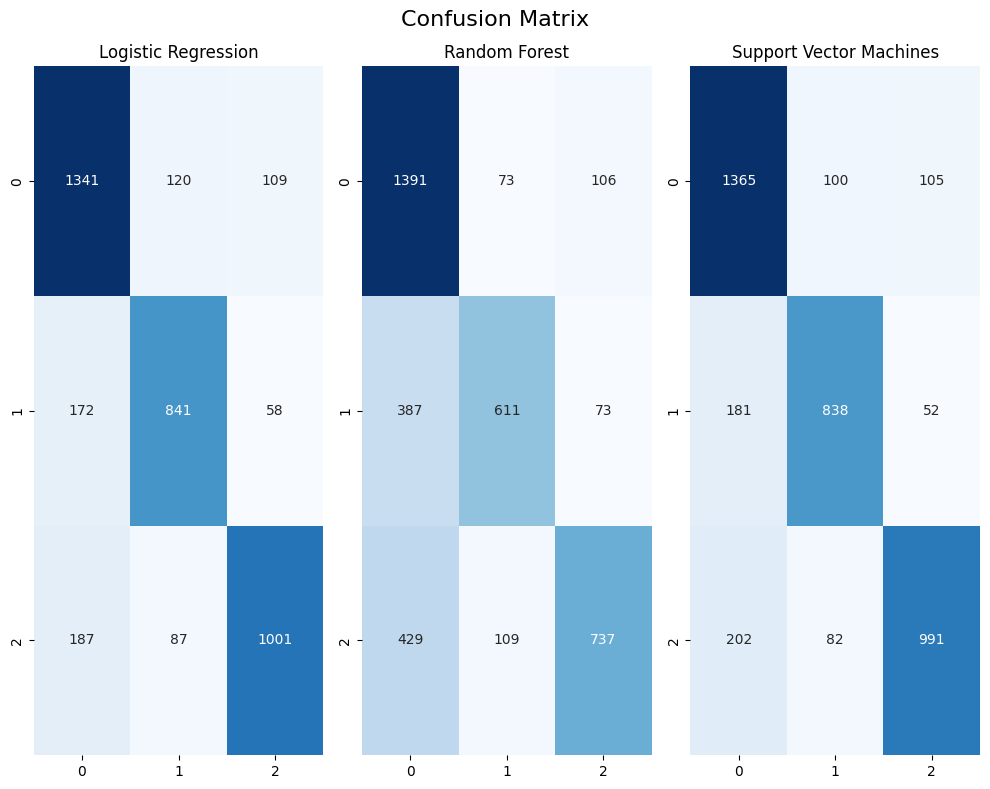

In [56]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data into Pandas DataFrame
data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X = data['text']
y = data['author']

# Encode the target labels into numerical values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

# Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
logreg_pred = logreg.predict(X_test)

# Random Forest
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

# Support Vector Machines (SVM)
svm = SVC(probability=True)  # Set probability=True to enable probability estimates
svm.fit(X_train, y_train)
svm_pred = svm.predict(X_test)

# Calculate confusion matrix
logreg_cm = confusion_matrix(y_test, logreg_pred)
rf_cm = confusion_matrix(y_test, rf_pred)
svm_cm = confusion_matrix(y_test, svm_pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
plt.suptitle('Confusion Matrix', fontsize=16)

plt.subplot(131)
sns.heatmap(logreg_cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Logistic Regression')

plt.subplot(132)
sns.heatmap(rf_cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Random Forest')

plt.subplot(133)
sns.heatmap(svm_cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Support Vector Machines')

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


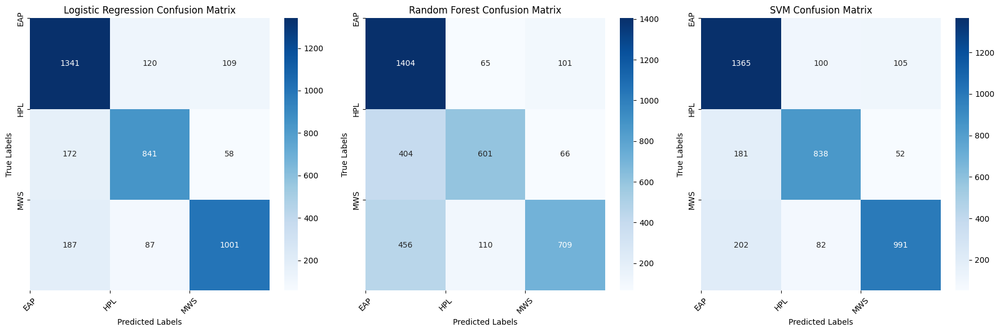

In [63]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data into Pandas DataFrame
data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X = data['text']
y = data['author']

# Encode the target labels into numerical values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

# Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
logreg_pred = logreg.predict(X_test)

# Random Forest
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

# Support Vector Machines (SVM)
svm = SVC()
svm.fit(X_train, y_train)
svm_pred = svm.predict(X_test)

# Evaluate the algorithms using various metrics
logreg_accuracy = accuracy_score(y_test, logreg_pred)
rf_accuracy = accuracy_score(y_test, rf_pred)
svm_accuracy = accuracy_score(y_test, svm_pred)

# Calculate confusion matrices
logreg_cm = confusion_matrix(y_test, logreg_pred)
rf_cm = confusion_matrix(y_test, rf_pred)
svm_cm = confusion_matrix(y_test, svm_pred)

# Plot confusion matrices
class_names = label_encoder.classes_
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
sns.heatmap(logreg_cm, annot=True, fmt="d", cmap="Blues")
plt.title("Logistic Regression Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.xticks(ticks=range(len(class_names)), labels=class_names, rotation=45)
plt.yticks(ticks=range(len(class_names)), labels=class_names)

plt.subplot(1, 3, 2)
sns.heatmap(rf_cm, annot=True, fmt="d", cmap="Blues")
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.xticks(ticks=range(len(class_names)), labels=class_names, rotation=45)
plt.yticks(ticks=range(len(class_names)), labels=class_names)

plt.subplot(1, 3, 3)
sns.heatmap(svm_cm, annot=True, fmt="d", cmap="Blues")
plt.title("SVM Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.xticks(ticks=range(len(class_names)), labels=class_names, rotation=45)
plt.yticks(ticks=range(len(class_names)), labels=class_names)

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


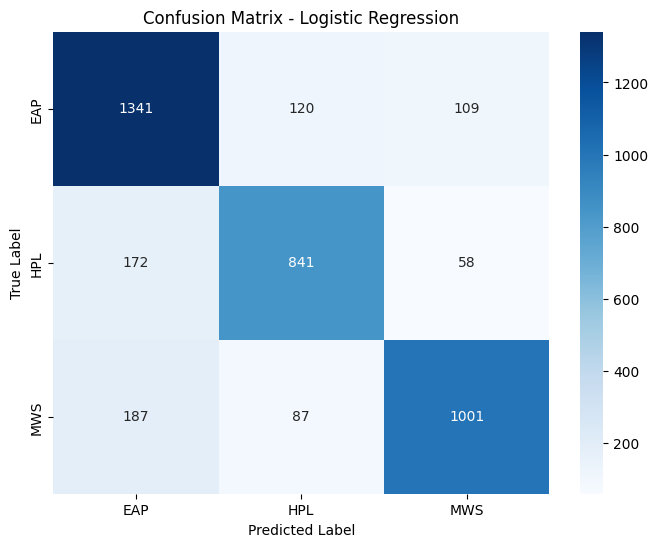

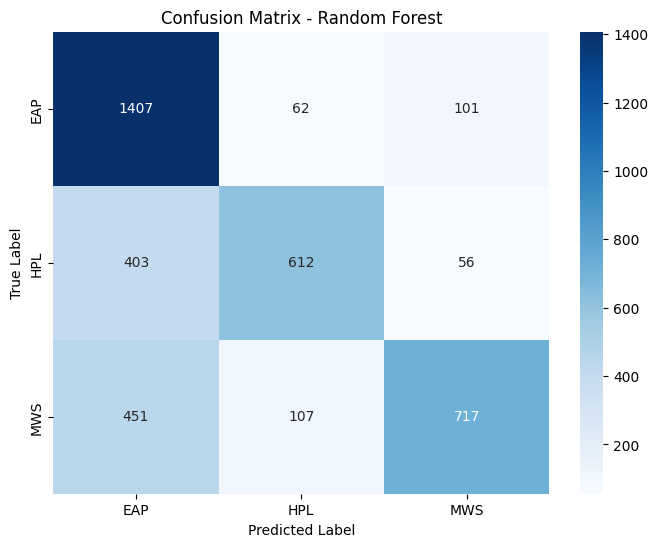

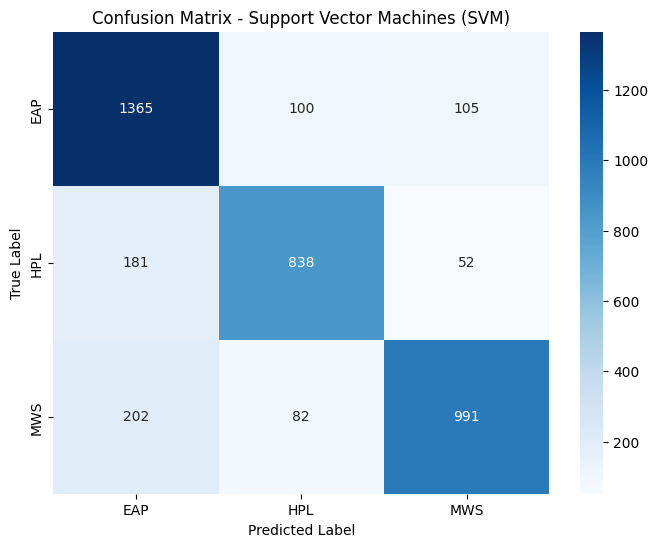

In [64]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data into Pandas DataFrame
data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X = data['text']
y = data['author']

# Encode the target labels into numerical values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

# Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
logreg_pred = logreg.predict(X_test)

# Random Forest
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

# Support Vector Machines (SVM)
svm = SVC(probability=True)  # Set probability=True to enable probability estimates
svm.fit(X_train, y_train)
svm_pred = svm.predict(X_test)

# Evaluate the algorithms using various metrics
logreg_accuracy = accuracy_score(y_test, logreg_pred)
logreg_precision = precision_score(y_test, logreg_pred, average='weighted')
logreg_recall = recall_score(y_test, logreg_pred, average='weighted')
logreg_f1 = f1_score(y_test, logreg_pred, average='weighted')

rf_accuracy = accuracy_score(y_test, rf_pred)
rf_precision = precision_score(y_test, rf_pred, average='weighted')
rf_recall = recall_score(y_test, rf_pred, average='weighted')
rf_f1 = f1_score(y_test, rf_pred, average='weighted')

svm_accuracy = accuracy_score(y_test, svm_pred)
svm_precision = precision_score(y_test, svm_pred, average='weighted')
svm_recall = recall_score(y_test, svm_pred, average='weighted')
svm_f1 = f1_score(y_test, svm_pred, average='weighted')

# Calculate the confusion matrix
logreg_cm = confusion_matrix(y_test, logreg_pred)
rf_cm = confusion_matrix(y_test, rf_pred)
svm_cm = confusion_matrix(y_test, svm_pred)

# Define the class labels
class_labels = label_encoder.classes_

# Plot the confusion matrix for Logistic Regression
plt.figure(figsize=(8, 6))
sns.heatmap(logreg_cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix - Logistic Regression')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Plot the confusion matrix for Random Forest
plt.figure(figsize=(8, 6))
sns.heatmap(rf_cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix - Random Forest')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Plot the confusion matrix for Support Vector Machines (SVM)
plt.figure(figsize=(8, 6))
sns.heatmap(svm_cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix - Support Vector Machines (SVM)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


11. Identify important features contributing to classification

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


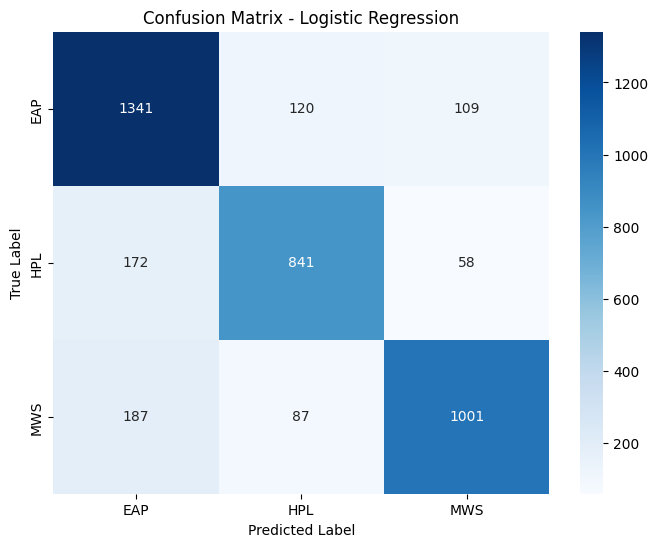

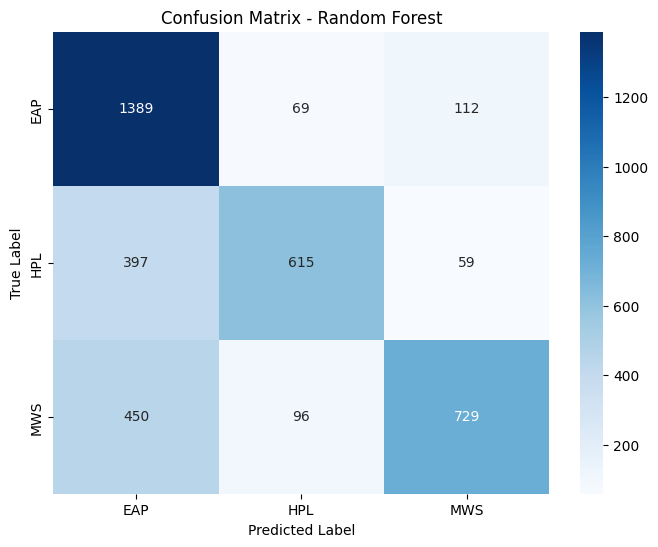

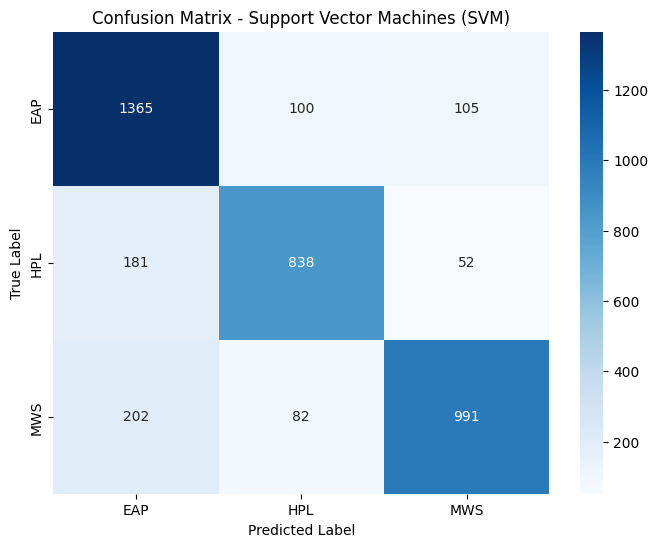

ValueError: ignored

<Figure size 1000x600 with 0 Axes>

In [65]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data into Pandas DataFrame
data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X = data['text']
y = data['author']

# Encode the target labels into numerical values
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Apply TF-IDF vectorization to the training and test data
X_train = vectorizer.fit_transform(X_train)
X_test = vectorizer.transform(X_test)

# Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
logreg_pred = logreg.predict(X_test)

# Random Forest
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

# Support Vector Machines (SVM)
svm = SVC(probability=True)  # Set probability=True to enable probability estimates
svm.fit(X_train, y_train)
svm_pred = svm.predict(X_test)

# Evaluate the algorithms using various metrics
logreg_accuracy = accuracy_score(y_test, logreg_pred)
logreg_precision = precision_score(y_test, logreg_pred, average='weighted')
logreg_recall = recall_score(y_test, logreg_pred, average='weighted')
logreg_f1 = f1_score(y_test, logreg_pred, average='weighted')

rf_accuracy = accuracy_score(y_test, rf_pred)
rf_precision = precision_score(y_test, rf_pred, average='weighted')
rf_recall = recall_score(y_test, rf_pred, average='weighted')
rf_f1 = f1_score(y_test, rf_pred, average='weighted')

svm_accuracy = accuracy_score(y_test, svm_pred)
svm_precision = precision_score(y_test, svm_pred, average='weighted')
svm_recall = recall_score(y_test, svm_pred, average='weighted')
svm_f1 = f1_score(y_test, svm_pred, average='weighted')

# Calculate the confusion matrix
logreg_cm = confusion_matrix(y_test, logreg_pred)
rf_cm = confusion_matrix(y_test, rf_pred)
svm_cm = confusion_matrix(y_test, svm_pred)

# Define the class labels
class_labels = label_encoder.classes_

# Plot the confusion matrix for Logistic Regression
plt.figure(figsize=(8, 6))
sns.heatmap(logreg_cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix - Logistic Regression')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Plot the confusion matrix for Random Forest
plt.figure(figsize=(8, 6))
sns.heatmap(rf_cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix - Random Forest')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Plot the confusion matrix for Support Vector Machines (SVM)
plt.figure(figsize=(8, 6))
sns.heatmap(svm_cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix - Support Vector Machines (SVM)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Get feature importance for Random Forest
rf_feature_importance = rf.feature_importances_

# Sort feature importance in descending order
sorted_indices = rf_feature_importance.argsort()[::-1]
sorted_features = vectorizer.get_feature_names_out()[sorted_indices]
sorted_importance = rf_feature_importance[sorted_indices]

# Plot feature importance for Random Forest
plt.figure(figsize=(10, 6))
sns.barplot(x=sorted_importance, y=sorted_features[:20], palette='viridis')
plt.title('Top 20 Feature Importance - Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Get feature importance for Logistic Regression
logreg_feature_importance = logreg.coef_

# Sort feature importance in descending order
sorted_indices = logreg_feature_importance.argsort()[::-1]
sorted_features = vectorizer.get_feature_names_out()[sorted_indices]
sorted_importance = logreg_feature_importance[sorted_indices]

# Plot feature importance for Logistic Regression
plt.figure(figsize=(10, 6))
sns.barplot(x=sorted_importance[0][:20], y=sorted_features[0][:20], palette='viridis')
plt.title('Top 20 Feature Importance - Logistic Regression')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


In [77]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

# Load the data
train_data = pd.read_csv('/content/train.csv')

# Prepare the data for training
X_train_text = train_data['text']
y_train = train_data['author']

# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Fit and transform the training data
X_train = vectorizer.fit_transform(X_train_text)

# Get the feature names
feature_names = vectorizer.get_feature_names_out()

# Initialize the Logistic Regression classifier
logreg = LogisticRegression()

# Fit the classifier on the training data
logreg.fit(X_train, y_train)

# Get the coefficients from the Logistic Regression model
coefficients = logreg.coef_

# Create a DataFrame to store the feature importances
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': coefficients[0]})

# Sort the DataFrame by importance in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Print the top 10 important features
print(feature_importances.head(10))


          Feature  Importance
23655        upon    4.254276
14013     minutes    2.230799
10784     however    2.220059
12528        lady    2.215813
13313      madame    2.183264
12063          is    2.144742
6906        dupin    2.141913
725    altogether    1.990807
14370          mr    1.971641
22281        thus    1.965426


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


12. Write a 2-3 sentence minimum of findings, learnings, and what you would do next.


Based on the given assignment, some potential findings and learnings could be:

1. Spark SQL offers powerful capabilities for data manipulation and analysis, allowing for efficient querying, aggregation, and transformation of large datasets.
2. Working with text data in Spark requires preprocessing steps such as tokenization, stop word removal, and feature extraction using techniques like TF-IDF. These steps help in preparing the data for machine learning tasks.

Next, I would focus on the following steps:

1. Explore different machine learning algorithms in Spark, such as logistic regression, random forest, and support vector machines, to identify the most effective model for authorship classification.
2. Evaluate the performance of the chosen model using appropriate metrics like accuracy, precision, recall, and F1 score.
3. Further enhance the analysis by incorporating advanced techniques such as word embeddings (e.g., Word2Vec) to capture semantic meaning in the text data.
4. Experiment with different feature engineering techniques and parameter tuning to optimize the model's performance.
5. Visualize the results, including confusion matrices, feature importance, and lexical density, to gain insights into the classification process and identify areas for improvement.